# Intro

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [1]:
cfg_file='ll.yml'
expt_path = 'C:\\_Data\\ll\\'

ip = '192.168.137.1'
ip = '10.108.30.23'
max_t1 = 250

## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

from qick import QickConfig

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.helpers import handy
from slab_qick_calib.calib.time_tracking import time_tracking

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

<module 'slab_qick_calib.experiments' from 'C:\\_Lib\\python\\qq\\slab_qick_calib\\experiments\\__init__.py'>
C:\_Lib\python\qq\slab_qick_calib\experiments
imported slab_qick_calib.experiments.general.qick_experiment
imported slab_qick_calib.experiments.general.qick_experiment_2q
imported slab_qick_calib.experiments.general.qick_program
C:\_Lib\python\qq\slab_qick_calib\experiments\general
C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit
imported slab_qick_calib.experiments.single_qubit.active_reset
imported slab_qick_calib.experiments.single_qubit.pulse_probe_spectroscopy
imported slab_qick_calib.experiments.single_qubit.rabi
imported slab_qick_calib.experiments.single_qubit.resonator_spectroscopy
imported slab_qick_calib.experiments.single_qubit.single_shot
imported slab_qick_calib.experiments.single_qubit.single_shot_opt
imported slab_qick_calib.experiments.single_qubit.stark_spectroscopy
imported slab_qick_calib.experiments.single_qubit.t1
imported slab_qick_calib.experim

## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [3]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 6
rfsoc_alias = 'bf3_soc'
t1_guess = 150 

import os
from slab_qick_calib.helpers import config

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess)

    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\ll\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [4]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=ip)
print(im)
soc = QickConfig(im[auto_cfg['aliases']['soc']].get_cfg())
#print(soc)

cfg_dict = {'soc': soc, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

QICK library version mismatch: 0.2.354 remote (the board), 0.2.363 local (the PC)
                        This may cause errors, usually KeyError in QickConfig initialization.
                        If this happens, you must bring your versions in sync.


{'Pyro.NameServer': <Pyro4.core.Proxy at 0x18306ba1af0; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>, 'bf3_soc': <Pyro4.core.Proxy at 0x1837f75bf20; not connected; for PYRO:obj_2a149957e04a49e6b8129454a75fc2d4@10.108.30.27:33569>, 'Qick17': <Pyro4.core.Proxy at 0x1830688a600; not connected; for PYRO:obj_5de02467bfd54bc1b7c4908ba26eb066@10.108.30.17:41157>}


## How to update config (you can also just edit yml directly)

In [5]:
# #                                          param   value qubit #
# auto_cfg = config.update_readout(cfg_path, 'lamb', 5, qi)
# auto_cfg = config.update_qubit(cfg_path, 'f_ge', 5700, qi)

# # For multiple levels of nesting: 
# auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), 0.2, qi)

## Print scan params

In [6]:
t1 = meas.T1Experiment(cfg_dict, qi=0, print=True)

threshold_v: 2.9073
read_wait: 0.1
extra_delay: 0.2
reps: 378
rounds: 1
expts: 60
start: 0
span: 384.28200000000004
acStark: False
active_reset: True
qubit: [0]
qubit_chan: 0
threshold: 15071


In general, all scans will be interacted with either by running default, or giving arguments from params dict. 
You can run scans on list of different qubits or just one by adding first couple lines of each cell. 
Flag of update is used to decide if to set new config vals based on output of scan (if the fit looks good)

## Check QICK issues

### Check mirror frequencies on qubit

In [ ]:
from slab_qick_calib.helpers import qick_check
qick_check.check_freqs(0, cfg_dict)

### Check mirror frequencies from resonators

In [77]:
from slab_qick_calib.helpers import qick_check
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4915.2 MHz
Configured resonator frequencies (MHz):
[7144.857  7173.5808 7000.     7228.5287 7260.1859 7000.    ]
Aliased resonator frequencies (MHz):
[2685.543  2656.8192 2830.4    2601.8713 2570.2141 2830.4   ]


### Check sampling rates and minimum point spacing

In [ ]:

fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

In [ ]:
from slab_qick_calib.helpers import qick_check

# Assuming 'soc' is your QickSoc object
dac_channel = qick_check.get_ch(soc, '0_228', type='dac')
print(f'DAC channel for 0_228 is: {dac_channel}')
from slab_qick_calib.helpers.qick_check import get_ch, print_dac_channels, print_adc_channels

print_dac_channels(cfg_dict['soc'])

### Make sure you're not near the nyquist frequency of the ADC

In [ ]:
from slab_qick_calib.helpers import qick_check
qick_check.check_adc(cfg_dict)

# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

In [ ]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        #tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi,params={'readout_length':13})#,params={'frequency':fi})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [ ]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.65, qi)

## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

  0%|          | 0/1400000 [00:00<?, ?it/s]

Number of peaks: 0


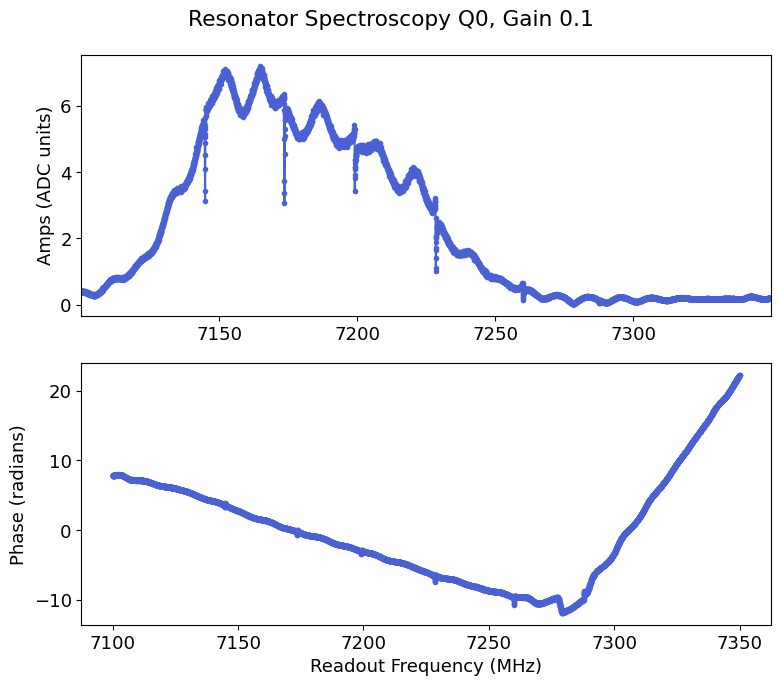

In [60]:
qi=0 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':7100, 'span':250, 'reps':200, 'gain':0.1, 'expts':7000}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

Change prom (prominence value) to adjust how many peaks you find

Number of peaks: 8


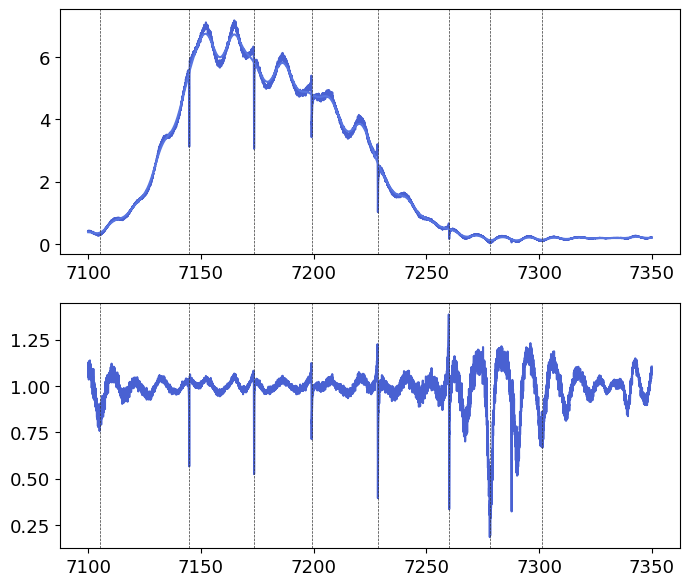

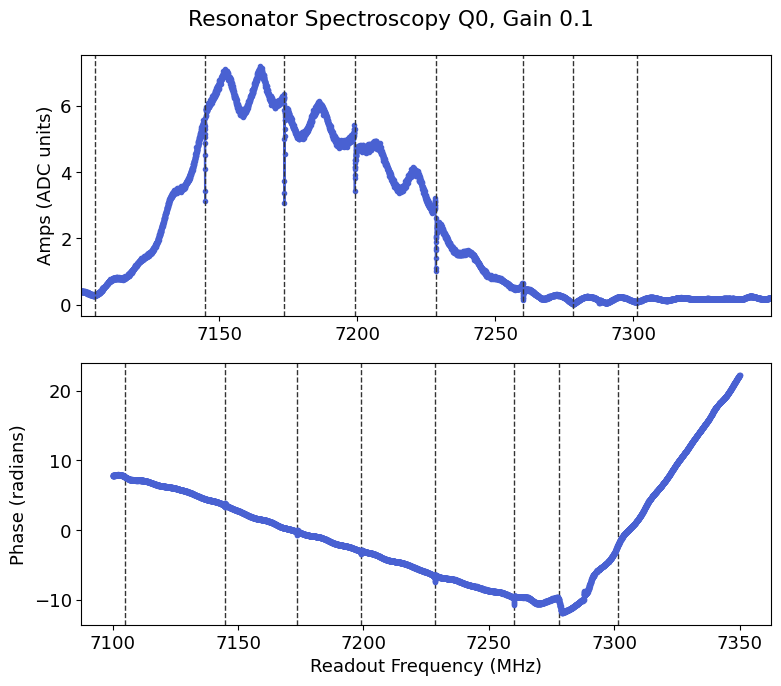

In [63]:
rspecc.analyze(peaks=True, debug=True, fit=False, prom=0.3)
rspecc.display(peaks=True, fit=False)
res_values = rspecc.data['coarse_peaks']

In [ ]:
res_values

Can delete values from res_values if they don't seem to be real res_values. 

In [64]:
res_values = np.delete(res_values, 0)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

In [8]:
update=True

num_peaks = len(res_values)

for qi in range(1,len(res_values)):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'center':res_values[qi]}, disp_kwargs={'plot_res':False})

    if update: rspec.update()

NameError: name 'res_values' is not defined

### Fine resonator scan

Once the correct frequencies are saved to your config file. 

  0%|          | 0/33000 [00:00<?, ?it/s]

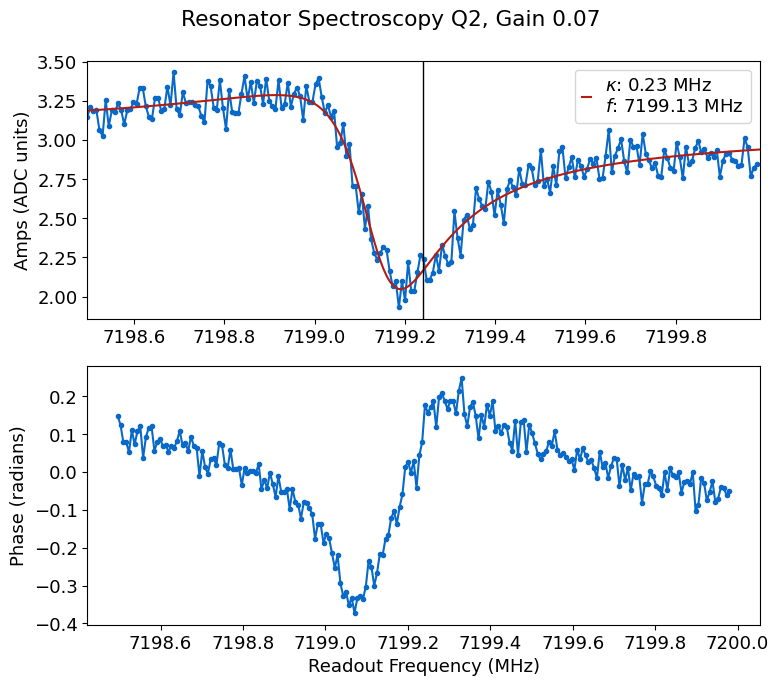

*Set cfg device.readout 2 frequency to 7199.1867 from 7199.2392*
*Set cfg device.readout 2 kappa to 0.2303 from 0.2143*
*Set cfg device.readout 2 qi to 5.2627 from 7.3559*
*Set cfg device.readout 2 qe to 7.7033 from 6.1857*


In [101]:
update=True # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
qubit_list = np.arange(3)
qubit_list=[2]

for qi in qubit_list:    
    # Manually set the span and gain 
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':10, 'gain':0.05, 'reps':500})

    # Fully automated, using previous fit to kappa to set span
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

### Low gain (for purcell)

  0%|          | 0/41580 [00:00<?, ?it/s]

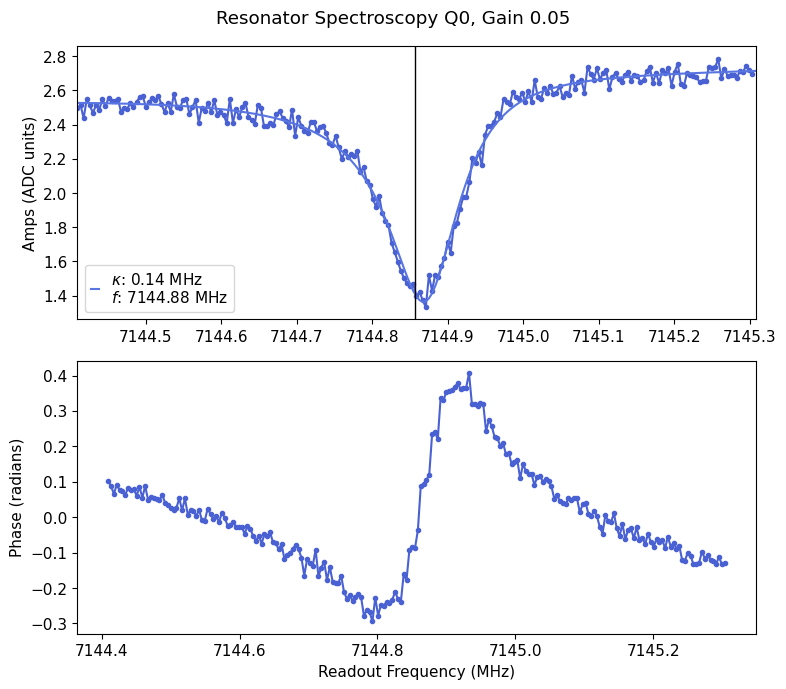

*Set cfg None 0 kappa_low to 0.137 from 0.2342*


In [99]:
update=True # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
qubit_list = np.arange(3)
qubit_list=[0]

for qi in qubit_list:    
    # Manually set the span and gain 
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':1, 'gain':0.3})

    # Fully automated, using previous fit to kappa to set span
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa', 'gain':0.05})
    auto_cfg = config.update_config(cfg_path[0:-4]+'_model.yml' , None,'kappa_low', float(rspec.data['kappa']), qi)

### Print out scan params

In [ ]:
rspec.data['kappa']

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

Setting up a new session...


  0%|          | 0/30 [00:00<?, ?it/s]

High power peak [MHz]: 7197.9152
Low power peak [MHz]: 7199.1541
Lamb shift [MHz]: -1.2389


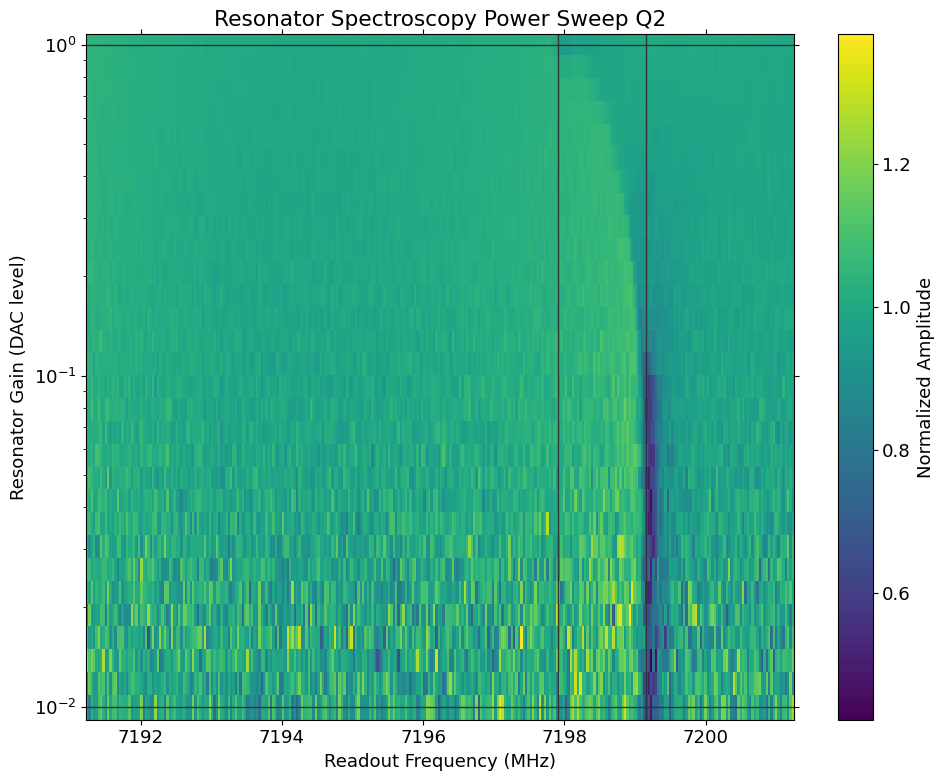

*Set cfg device.readout 2 lamb to -1.2389 from 0*


In [100]:
update=True

qubit_list = np.arange(3)
qubit_list=[2]

d=[]
for qi in qubit_list:
    #rpowspec=meas.ResSpecPower(cfg_dict, qi=qi)
    params={'rng':100,'max_gain':1, 'span':10,"f_off":3,'expts_gain':30}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

In [ ]:
qubit_list = np.arange(3)
qubit_list= [0]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.808	Fit par error:0.042	 Best fit:b'avgi'


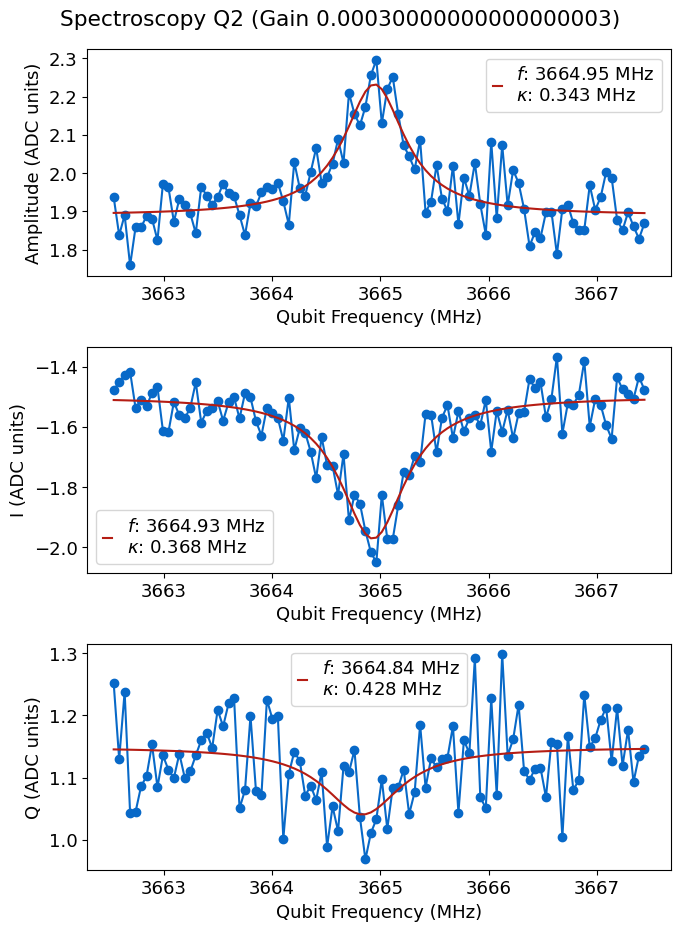

*Set cfg device.qubit 2 f_ge to 3664.9316 from 3664.9887*
*Set cfg device.qubit 2 kappa to 0.7358 from -1.8268*


In [105]:
update=True

#qubit_list = np.arange(3)
qubit_list = [2]

for qi in qubit_list: 
    # Default params, just specify style 
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'span':250})
    #params={'start':3300, 'span':500, 'gain':0.3}
    #params={'span':3,'expts':100,'gain':0.1,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params=params)
    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

## Stark (still getting it working)

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.2, 'df':-55,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/1890000 [00:00<?, ?it/s]

KeyboardInterrupt: 

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/1890000 [00:00<?, ?it/s]

ng2: 7151453.658426232


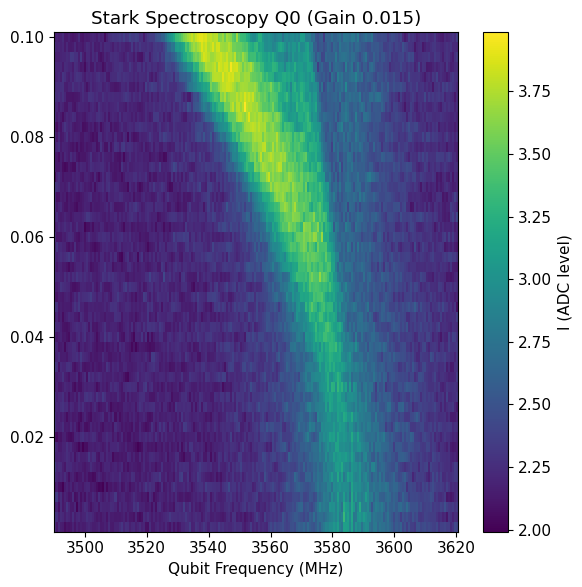

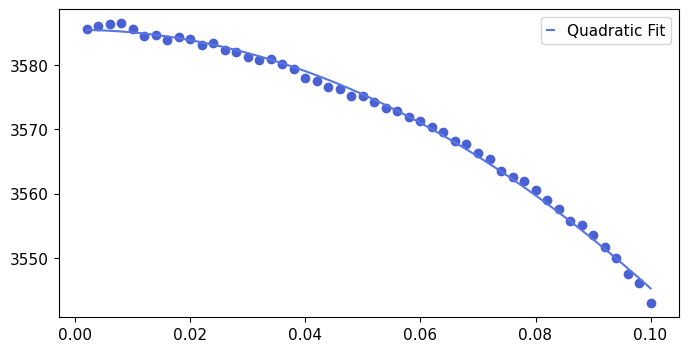

In [90]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.1, 'df':-30,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [97]:
eta = stark_spec.data['ng2']/auto_cfg_model['g_chi'][qi]

In [98]:
auto_cfg['device']['readout']['gain'][qi]**2*eta

np.float64(663.4468886194791)

In [95]:
auto_cfg= config.load(cfg_file_path)
auto_cfg['device']['readout']['gain'][qi]

0.078

In [77]:
auto_cfg_model = config.load(cfg_file_path[:-4] + '_model.yml')
auto_cfg_model['g_chi'][qi]

65.5809

## Power sweep

In [ ]:
qubit_list=[0]

for qi in qubit_list:
    #params={'start':3000,'span':1000,'expts':1000}
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':5320,'span':100,'reps':1000,'expts':200,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

Setting up a new session...


  0%|          | 0/10 [00:00<?, ?it/s]

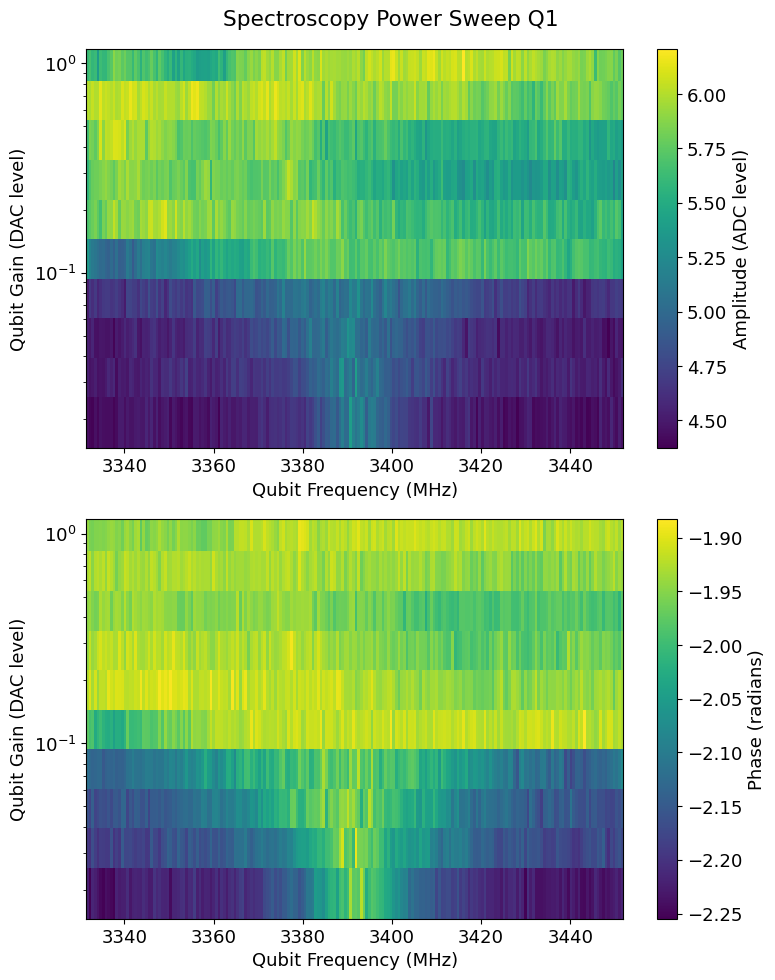

In [80]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[1]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow', live_plot=True)
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

  0%|          | 0/41580 [00:00<?, ?it/s]

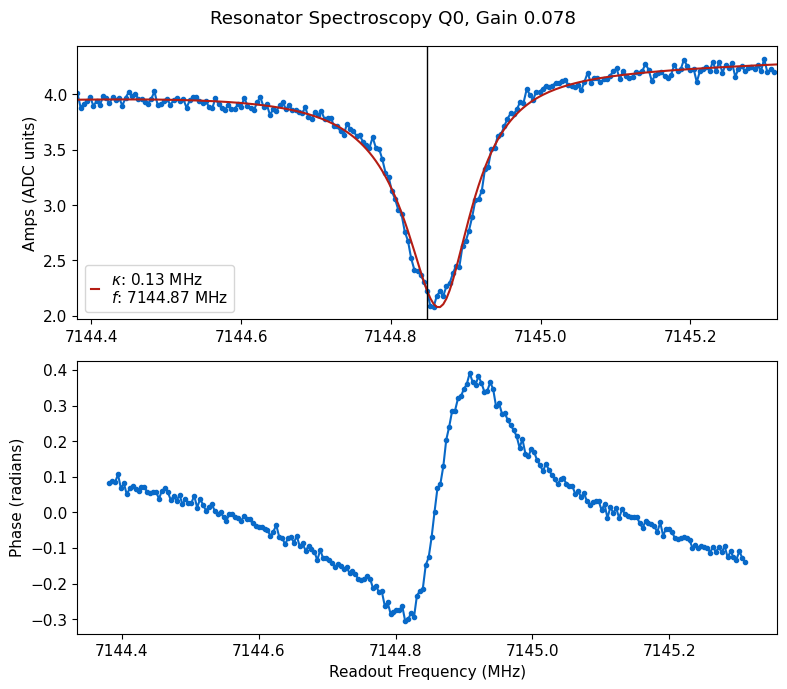

*Set cfg device.readout 0 frequency to 7144.857 from 7144.8479*
*Set cfg device.readout 0 kappa to 0.129 from 0.1345*
*Set cfg device.readout 0 qi to 11.1106 from 10.7448*
*Set cfg device.readout 0 qe to 11.0376 from 10.5045*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

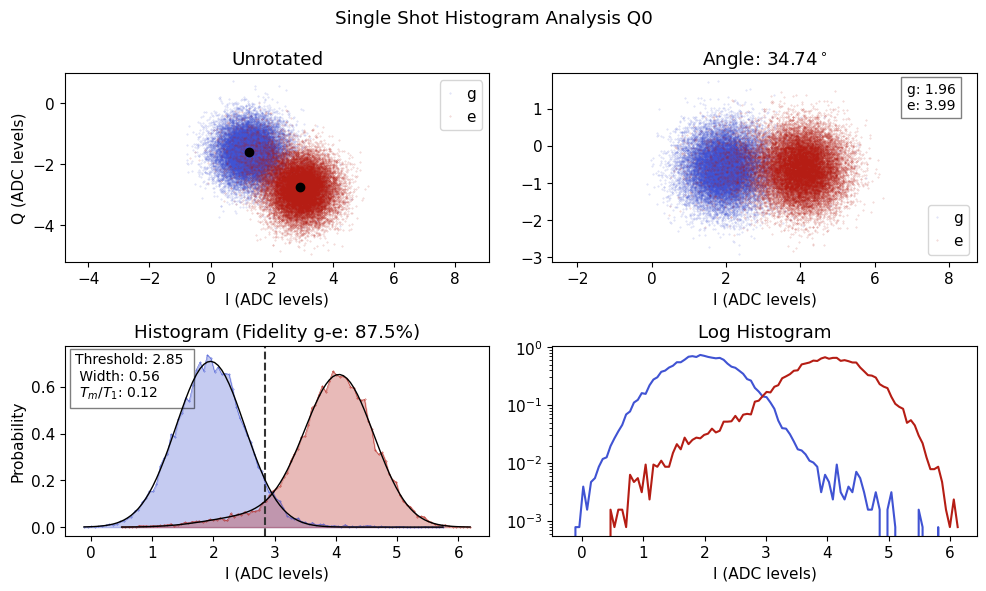

*Set cfg device.readout 0 phase to 34.7424 from 79.9302*
*Set cfg device.readout 0 threshold to 2.8487 from 3.0899*
*Set cfg device.readout 0 fidelity to 0.8748 from 0.907*
*Set cfg device.readout 0 sigma to 0.5625 from 0.5581*
*Set cfg device.readout 0 tm to 0.1249 from 0.1104*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.973	Fit par error:0.016	 Best fit:b'amps'


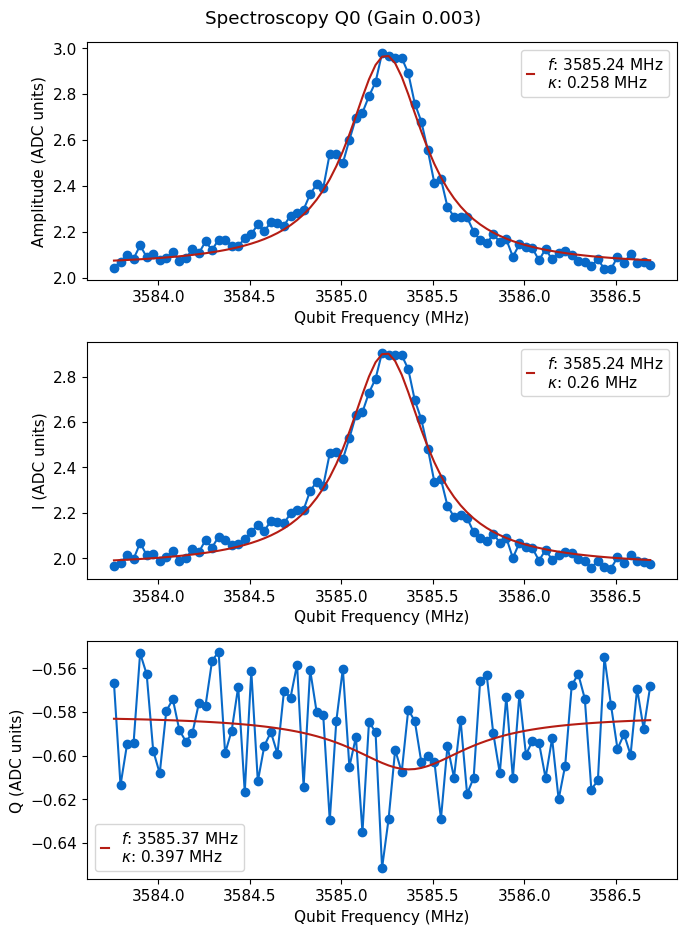

  0%|          | 0/11340 [00:00<?, ?it/s]

R2:0.992	Fit par error:0.008	 Best fit:b'avgi'


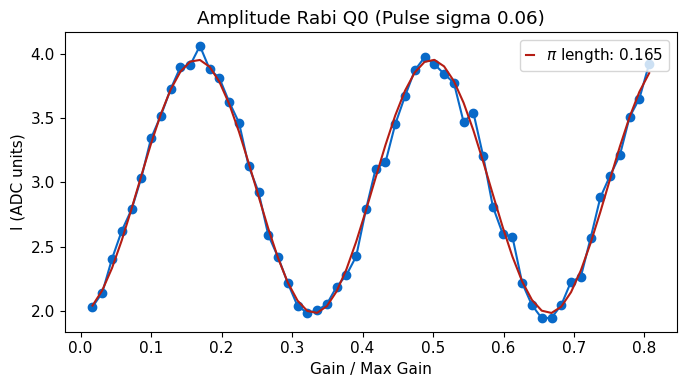

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.165 from 0.1642*
Try 0


  0%|          | 0/37800 [00:00<?, ?it/s]

R2:0.861	Fit par error:0.045	 Best fit:b'avgi'


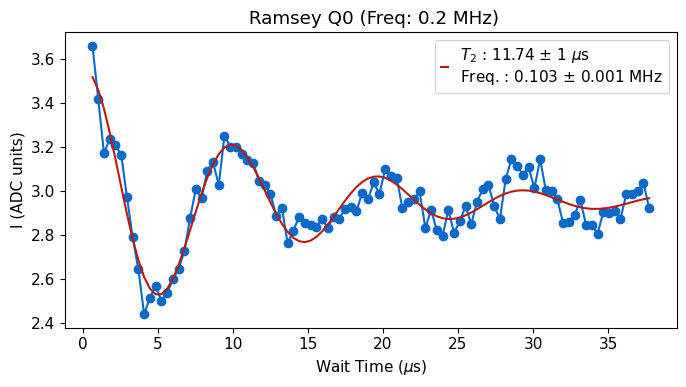

Scan successful. New frequency error is 0.097 MHz
*Set cfg device.qubit 0 f_ge to 3585.3196 from 3585.2226*
*Set cfg device.qubit 0 T2r to 11.7379 from 12.64*
Try 1


  0%|          | 0/37800 [00:00<?, ?it/s]

R2:0.910	Fit par error:0.035	 Best fit:b'avgi'


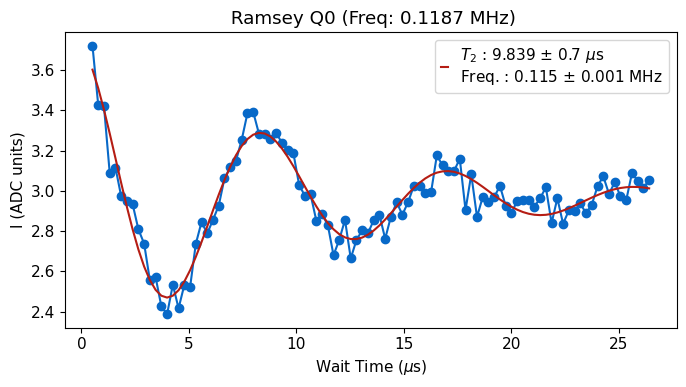

Scan successful. New frequency error is 0.003 MHz
*Set cfg device.qubit 0 f_ge to 3585.3231 from 3585.3196*
*Set cfg device.qubit 0 T2r to 9.8387 from 11.7379*
Total Change in frequency: 0.100 MHz
[np.float64(0.09695749897585879), np.float64(0.003470231571631871)]
Qubit 0 recentered from 3585.2226 to 3585.3231


  0%|          | 0/11340 [00:00<?, ?it/s]

R2:0.991	Fit par error:0.009	 Best fit:b'avgi'


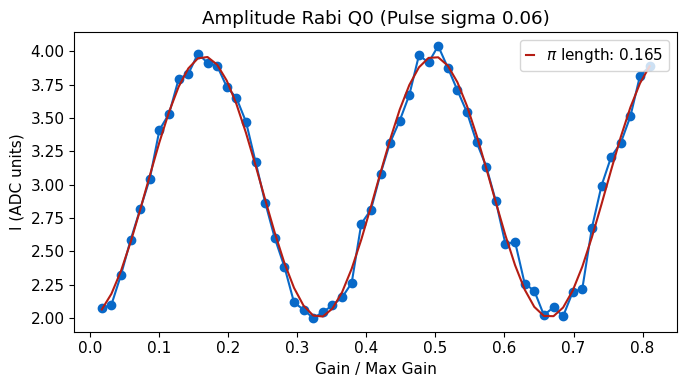

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1651 from 0.165*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

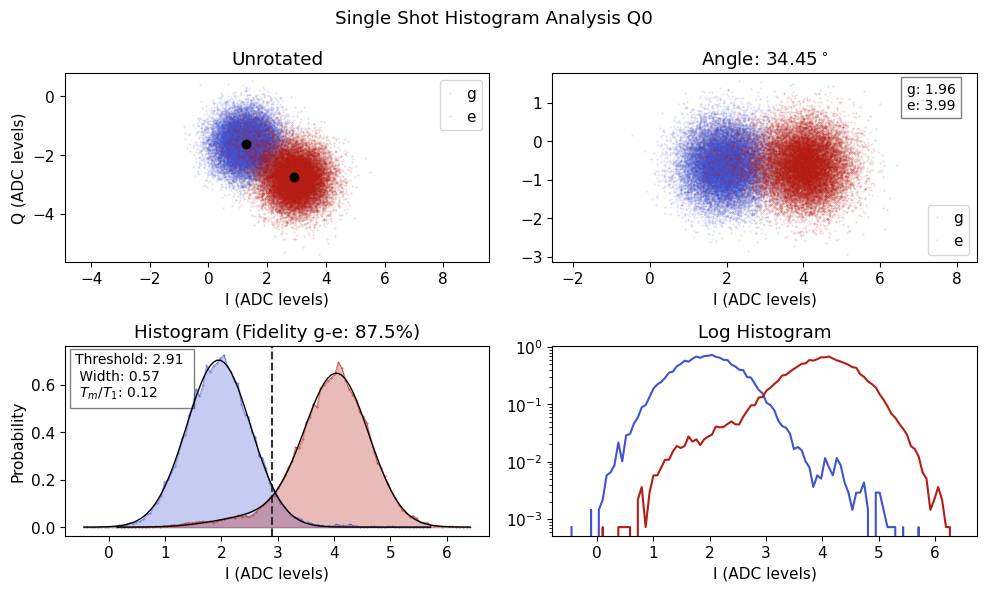

*Set cfg device.readout 0 phase to 34.4522 from 34.7424*
*Set cfg device.readout 0 threshold to 2.9073 from 2.8487*
*Set cfg device.readout 0 fidelity to 0.8747 from 0.8748*
*Set cfg device.readout 0 sigma to 0.5673 from 0.5625*
*Set cfg device.readout 0 tm to 0.1239 from 0.1249*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/37800 [00:00<?, ?it/s]

R2:0.914	Fit par error:0.032	 Best fit:b'avgi'


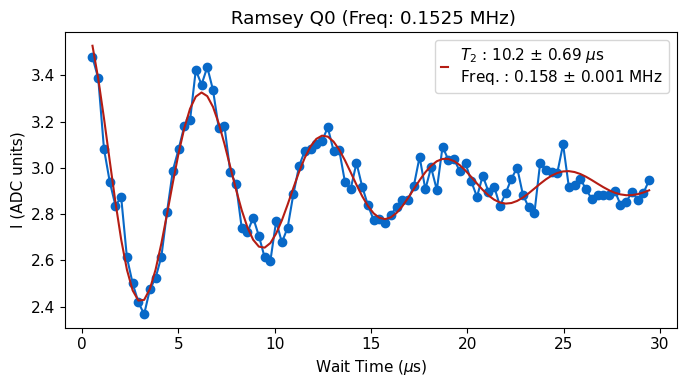

*Set cfg device.qubit 0 T2r to 10.2 from 9.8387*


  0%|          | 0/22680 [00:00<?, ?it/s]

R2:0.992	Fit par error:0.017	 Best fit:b'avgi'


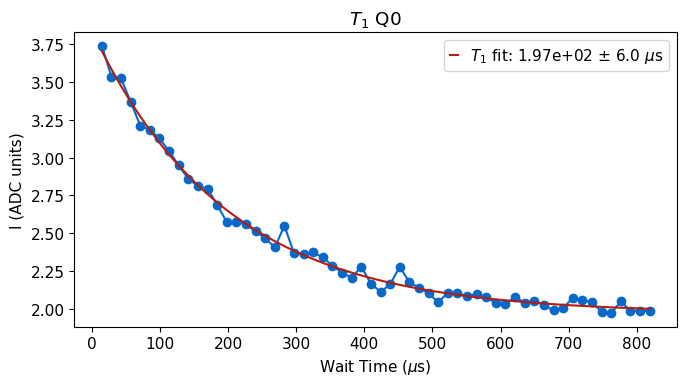

*Set cfg device.qubit 0 T1 to 196.57 from 225.11*
*Set cfg device.readout 0 final_delay to 1179.42 from 1350.64*


  0%|          | 0/37800 [00:00<?, ?it/s]

R2:0.905	Fit par error:0.029	 Best fit:b'avgi'


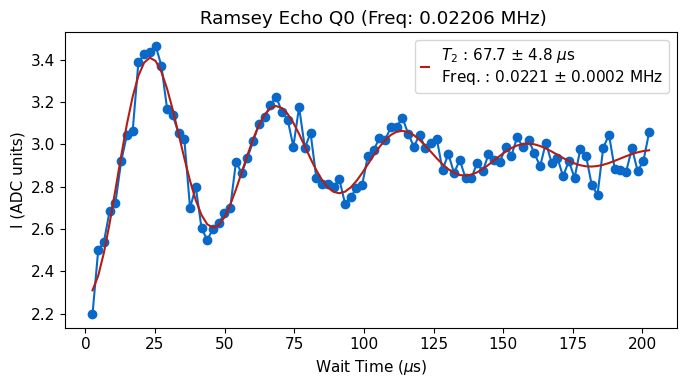

*Set cfg device.qubit 0 T2e to 67.7 from 68.0*


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

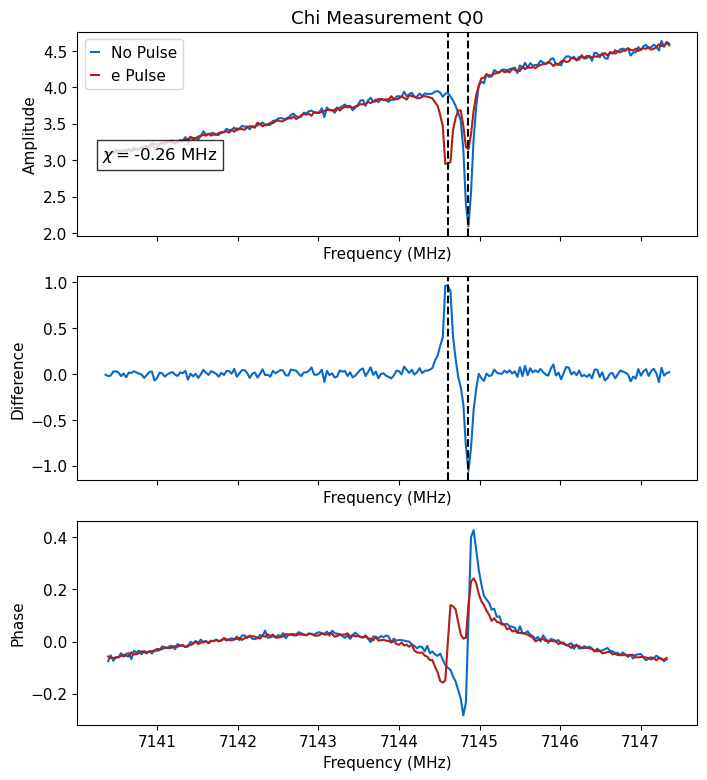

*Set cfg device.readout 0 chi to -0.2556 from -0.2236*


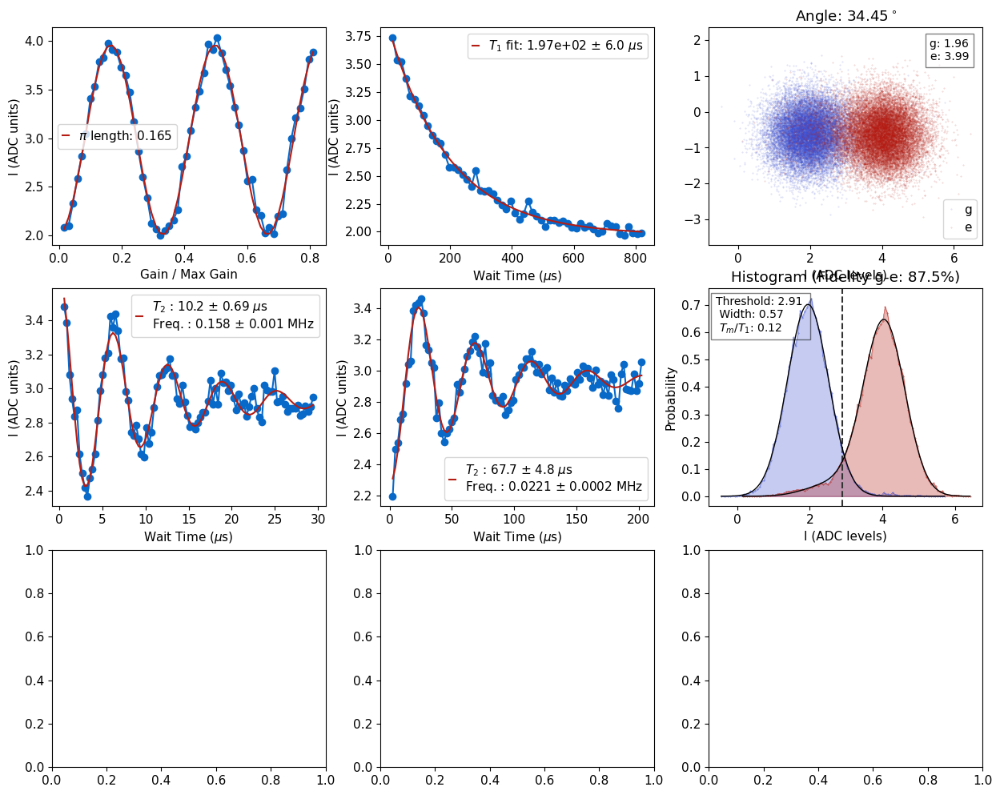

<Figure size 800x400 with 0 Axes>

C:\_Data\ll\images\summary\qubit0_measure_func_20250828_0754.png


In [21]:
qubit_list = np.arange(3)
qubit_list=[0]

#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad; gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=False, readout=True)

## Time tracking
fast = True only measures T2r and T1, otherwise does full set of scans.

In [ ]:
scan_length = 24 #  hours 

qubit_list = [0,1,2]
tt=time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.953	Fit par error:0.019	 Best fit:b'avgi'


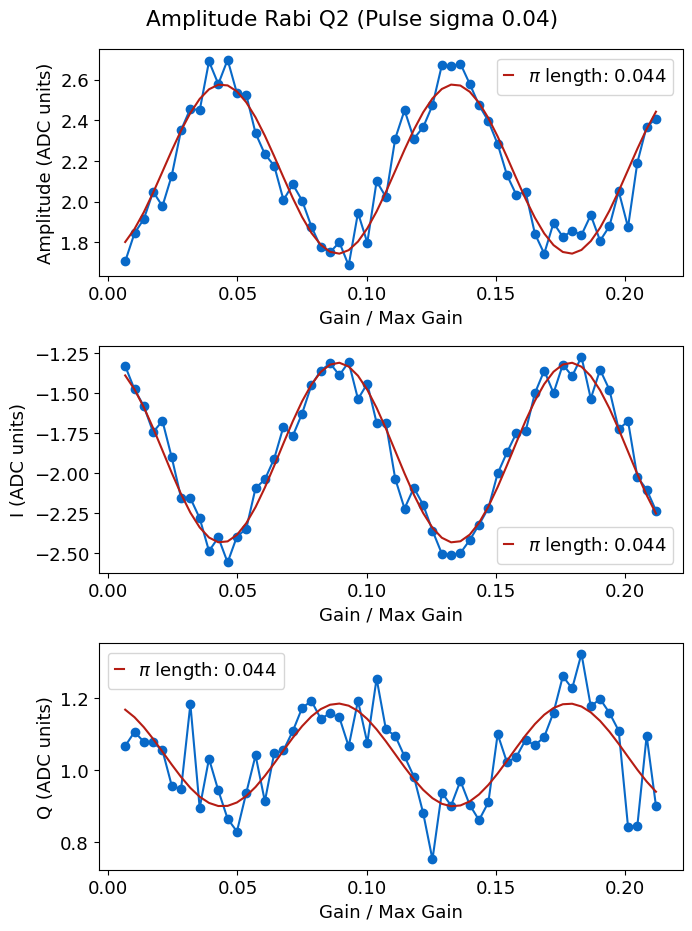

*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.0438 from 0.0431*


In [108]:
qubit_list = np.arange(3)
qubit_list=[2]

update=True

for qi in qubit_list: 
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

# Many pi pulses rabi

  0%|          | 0/11340 [00:00<?, ?it/s]

Attempted to init fitparam 1 to 14123.275862068966, which is out of bounds 0.001 to 1000. Instead init to 500.0005
R2:0.861	Fit par error:0.121	 Best fit:b'avgi'


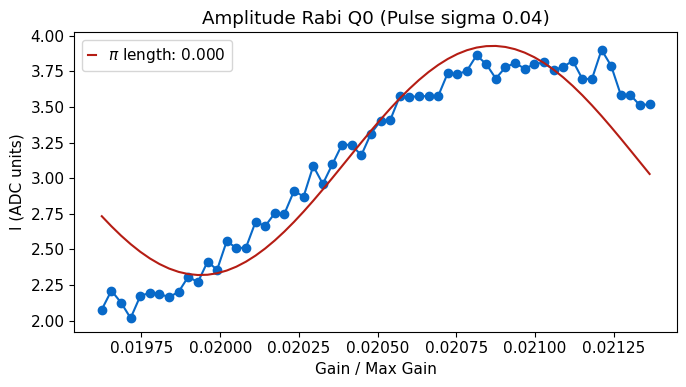

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.0209 from 0.021*


In [48]:
qi=0
update=True
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'n_pulses':15})
update=True
if update and amp_rabi.status:
    ind = np.argmax(amp_rabi.fitfunc(amp_rabi.data['xpts'], *amp_rabi.data['best_fit']))
    config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['xpts'][ind], qi);


#### Amp Chevron

In [ ]:
d2=[]
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':150,'sigma':0.25,'expts_f':100,'expts':100})

    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':30, 'expts_f':20, 'checkEF':True}, live_plot=True)
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

In [ ]:
handy.plot_many(d2, title='Rabi Chevron 7864', save_path=cfg_dict['expt_path'])

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

In [ ]:
qubit_list = [0]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const', 'max_length':0.2})

#### Length Chevron

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const"})
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const", 'length':0.2205, 'expts_f':40})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'rounds':4})

## Ramsey

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.892	Fit par error:0.034	 Best fit:b'amps'


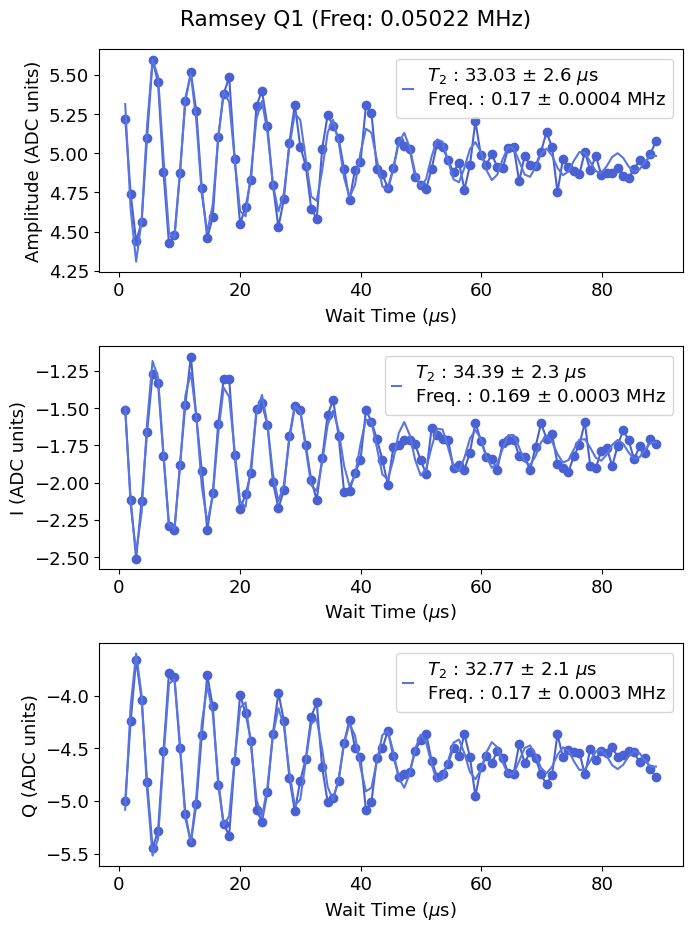

*Set cfg device.qubit 1 f_ge to 3391.5057 from 3391.6252*
*Set cfg device.qubit 1 T2r to 33.03 from 29.87*


In [84]:
qubit_list=[1]
update = True

for qi in qubit_list:
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)#, disp_kwargs={'show_hist':True})
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [2]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/18000 [00:00<?, ?it/s]

R2:0.987	Fit par error:0.021	 Best fit:b'avgi'


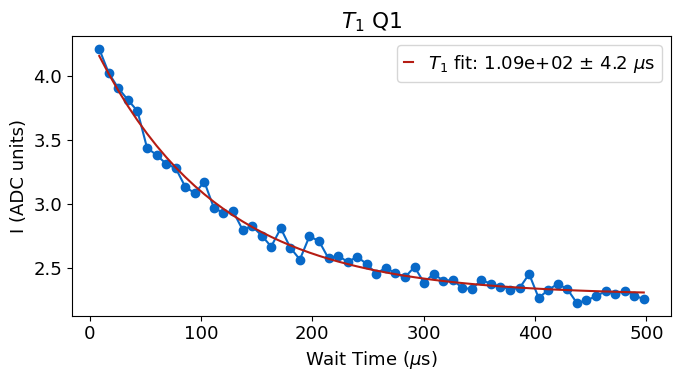

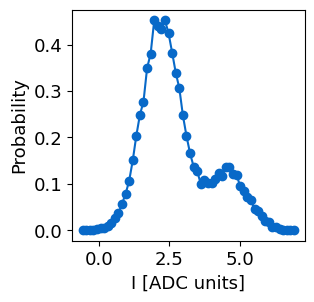

*Set cfg device.qubit 1 T1 to 109.4 from 136.75*
*Set cfg device.readout 1 final_delay to 656.38 from 820.48*


In [82]:
update=True
first_time=False

qubit_list = np.arange(3)
qubit_list=[1]
for qi in qubit_list:
    #t1 = meas.T1Experiment(cfg_dict, qi=qi)
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':1000,'span':0, 'start':20})
    t1 = meas.T1Experiment(cfg_dict, qi=qi, disp_kwargs={'show_hist':True})

    if update: t1.update(first_time=first_time)

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

  0%|          | 0/100000 [00:00<?, ?it/s]

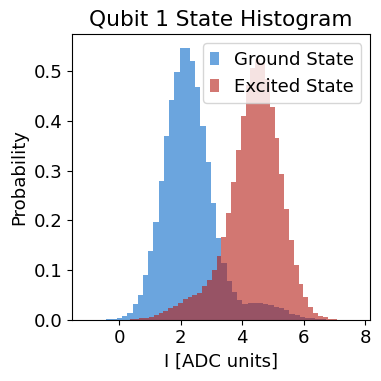

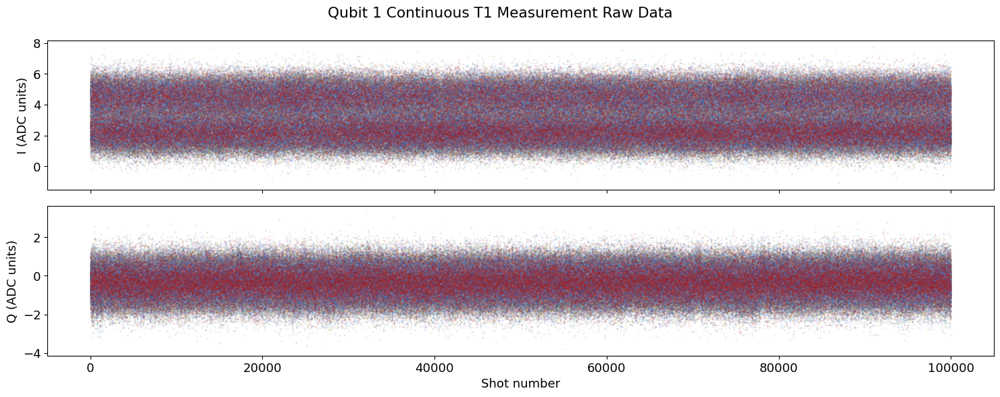

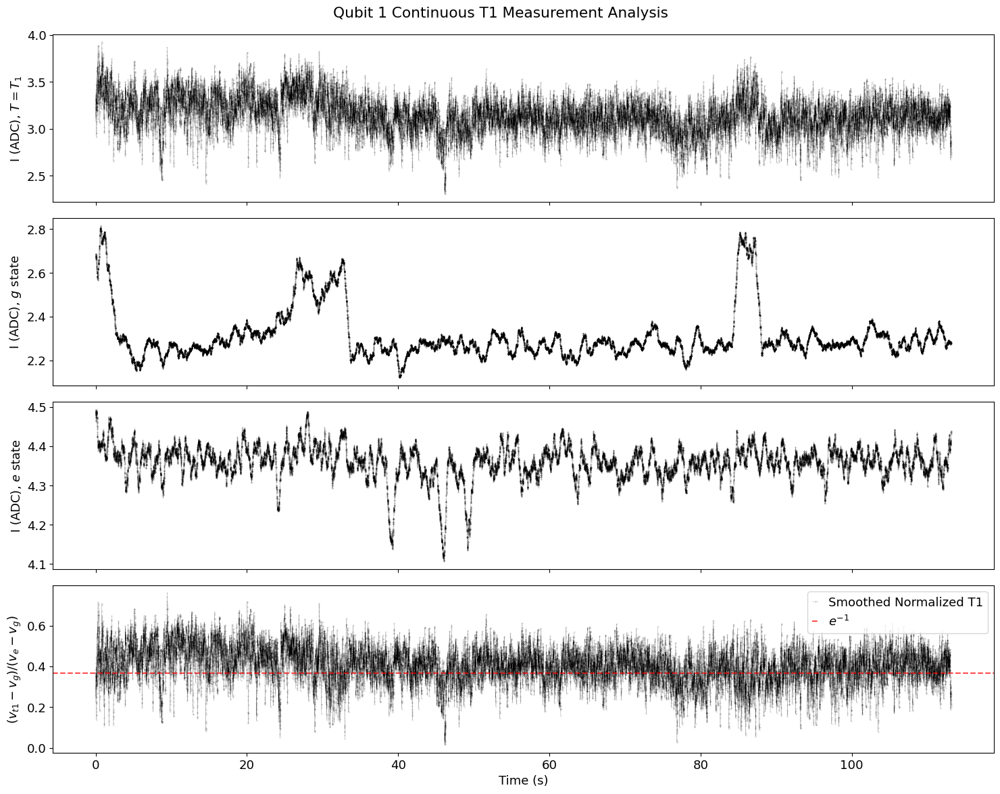

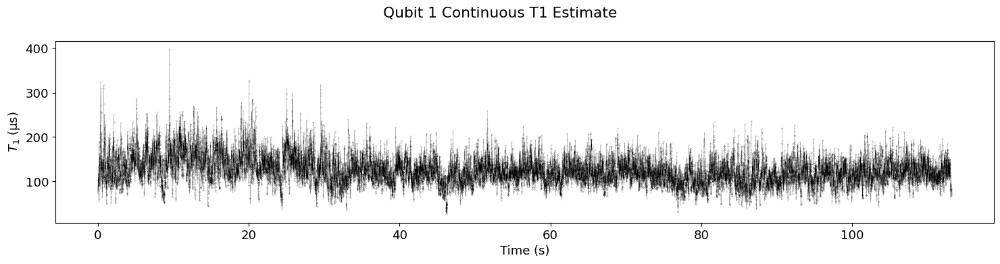

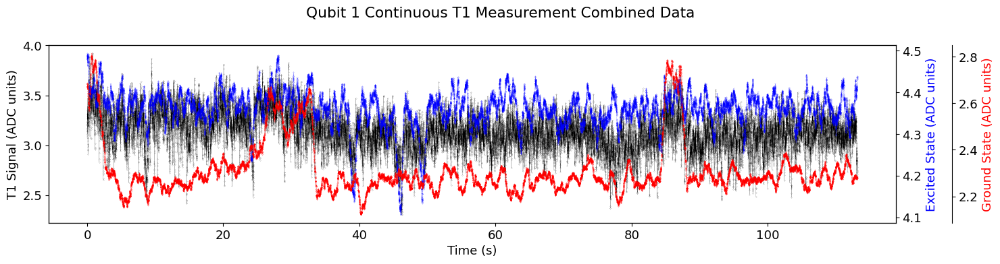

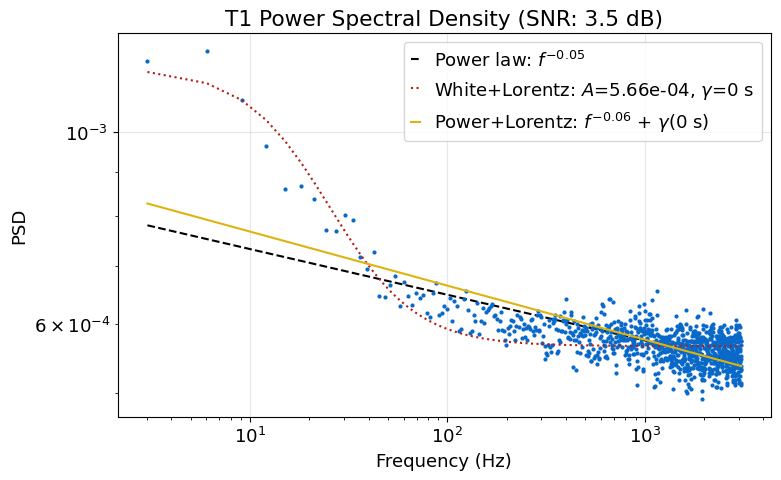

In [92]:
qi=1
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':100000})

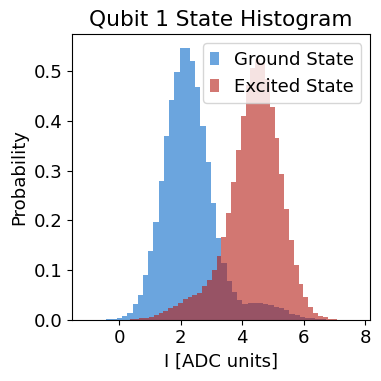

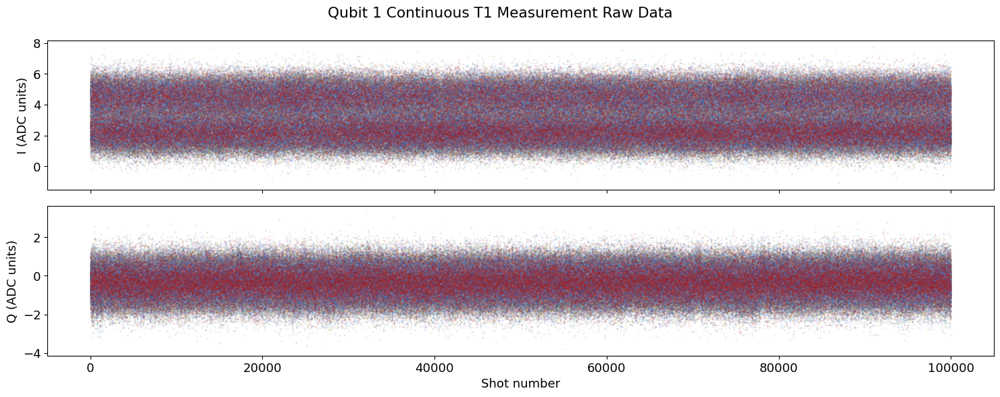

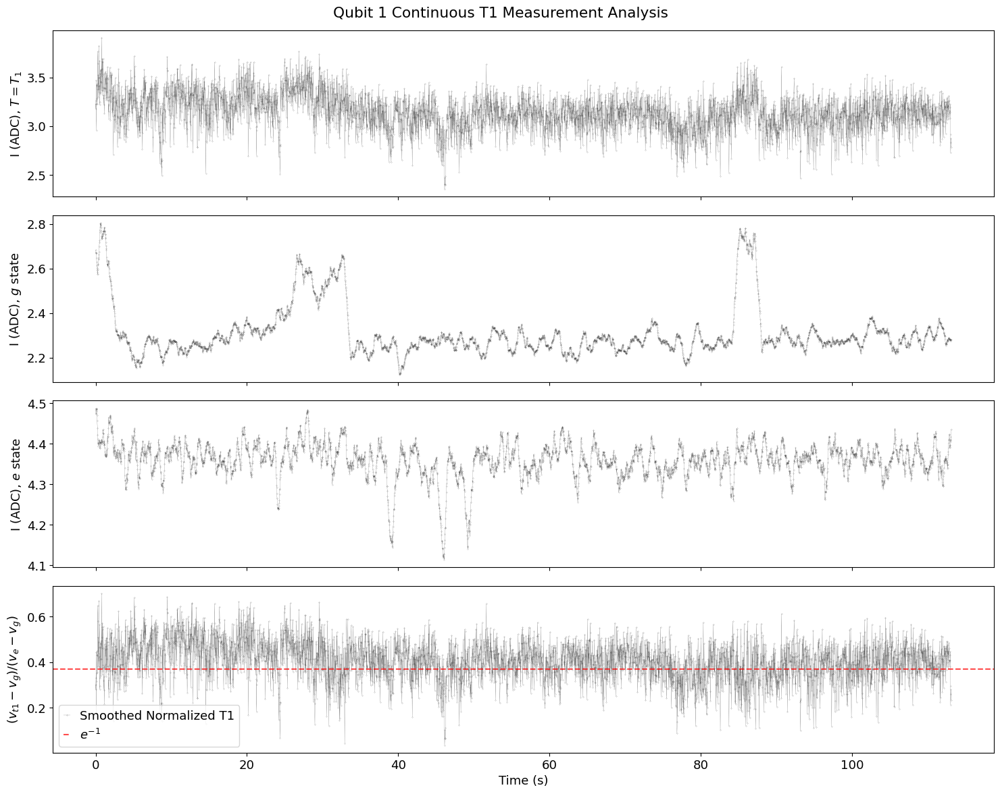

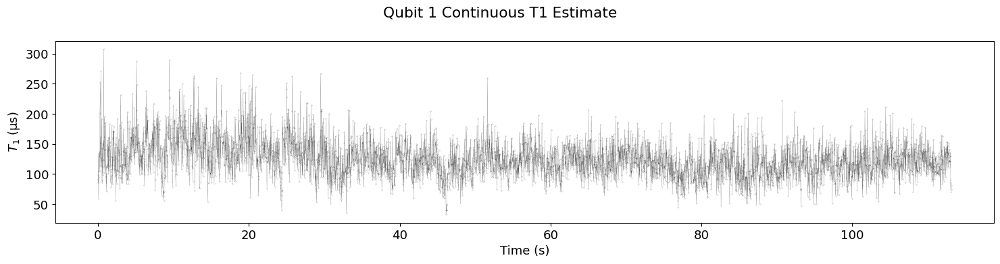

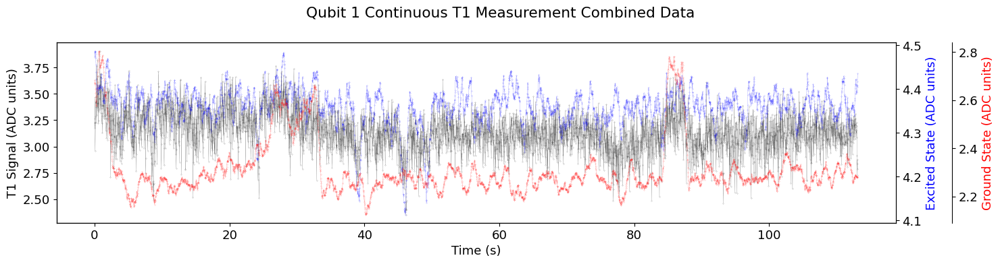

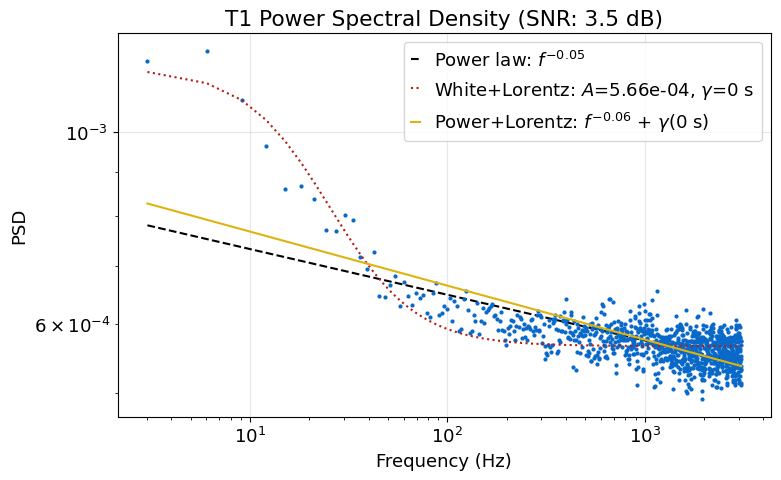

In [93]:
t1cont.display(filter_type='boxcar')

In [ ]:
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})

Sampling rate is 44.19524611183483 Hz


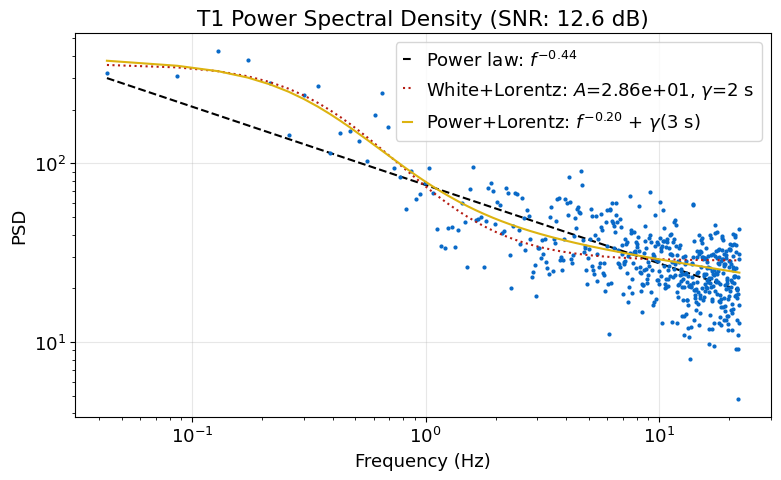

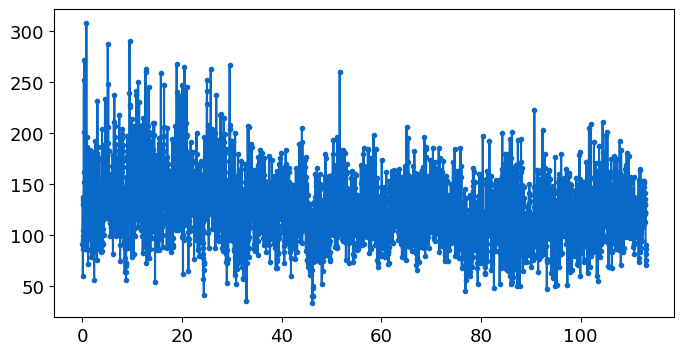

In [94]:
len(t1cont.data['t1_estimates'])
t1_data = t1cont.data['t1_estimates']

from slab_qick_calib.analysis import time_series
sampling_rate = 1/ float(t1cont.data['times'][2]-t1cont.data['times'][1])
print(f'Sampling rate is {sampling_rate} Hz')
nperseg = min(2048, int(2 ** np.floor(np.log2(len(t1_data) / 4))))

time_series.analyze_qubit_psd(
    t1_data, fs=sampling_rate, nperseg=nperseg
)

plt.figure()
plt.plot(t1cont.data['times'], t1cont.data['t1_estimates'], '.-')

Lorentzian fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 600.
  Mean T1: 124.79 µs
  Std T1: 30.75 µs
  Relative stability (std/mean): 0.2464
  Minimum Allan variance at tau = 6.29 seconds
  Minimum Allan variance: 3.18e+01
  Minimum Allan deviation: 5.64e+00


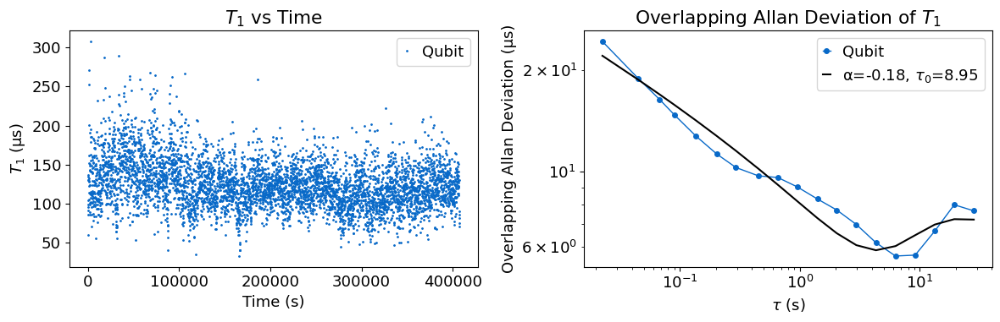

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(t1cont.data['times'], t1cont.data['t1_estimates'],'hi')

In [28]:

nan_inds = np.where(np.isnan(t1cont.data['t1_estimates']))[0]

times = np.delete(t1cont.data['times'], nan_inds)
t1_data = np.delete(t1cont.data['t1_estimates'], nan_inds)

  Mean T1: 178.35 µs
  Std T1: 50.11 µs
  Relative stability (std/mean): 0.2810
  Minimum Allan variance at tau = 32.33 seconds
  Minimum Allan variance: 2.60e+01
  Minimum Allan deviation: 5.10e+00


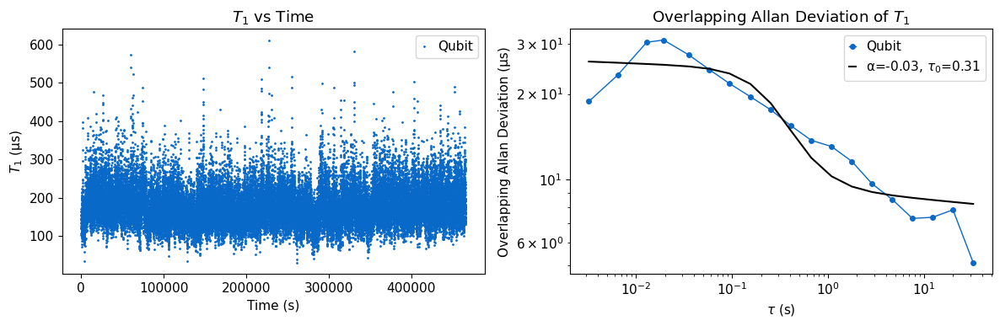

In [30]:
allan.perform_analysis(times, t1_data,'hi')

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.956	Fit par error:0.020	 Best fit:b'avgi'


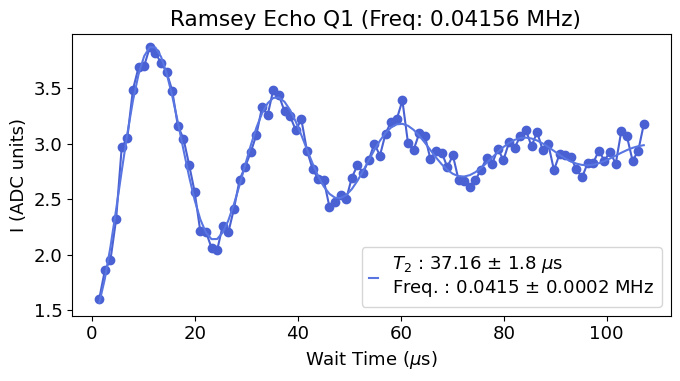

*Set cfg device.qubit 1 T2e to 37.16 from 36.09*


In [89]:
qubit_list = np.arange(3)
qubit_list=[1]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
update=True
nums_pi = [1,2,3,5,8,12]
t2_list = []
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'cpmg','num_pi':pi, 'span':400, 'ramsey_freq':0.02, 'reps':500})
        t2_list.append(t2e.data['best_fit'][3])


In [ ]:
plt.figure()
plt.plot(1/np.array(nums_pi), t2_list, 'o-')
plt.xlabel('1/Number of pi pulses')

### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=0
# This makes sure that waits are set correctly for active reset so that you get the same value from the buffer as ... 
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':10})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':10000,'active_reset':False, 'setup_reset':False})
shot.check_reset()

In [ ]:

np.mean(shot.data['Ig'])
np.mean(shot.data['Ie'])

# Single Shot

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

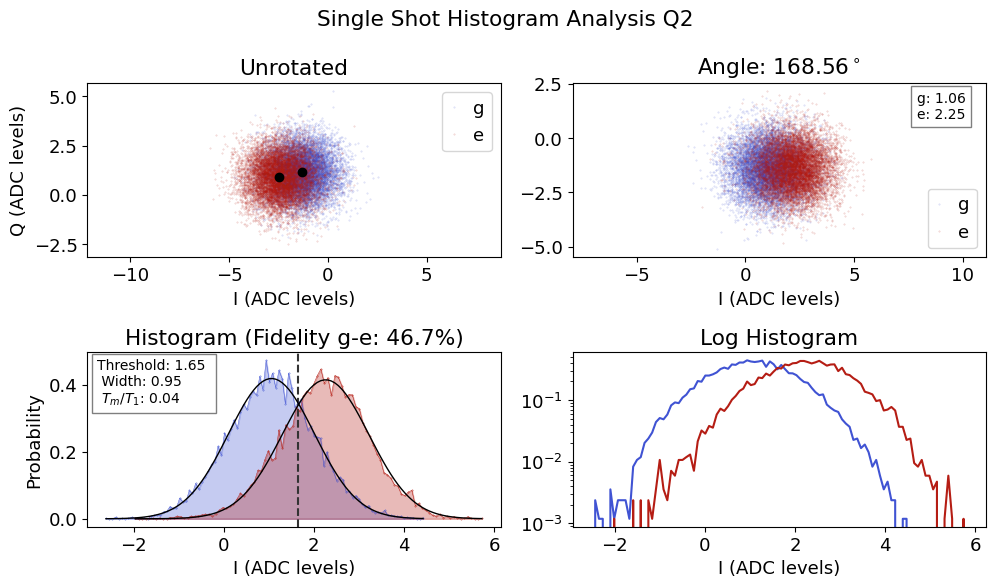

*Set cfg device.readout 2 phase to 168.558 from 0*
*Set cfg device.readout 2 threshold to 1.6538 from 10*
*Set cfg device.readout 2 fidelity to 0.4674 from 0*
*Set cfg device.readout 2 sigma to 0.9536 from 0*
*Set cfg device.readout 2 tm to 0.0445 from 0*
*Set cfg device.qubit 2 tuned_up to True from False*


In [109]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[2]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':300000})
    shot.update()

### Adjust reps for fidelity 

In [ ]:
max_inc = 15 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [0]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Unexpected parameters found in params: {'step_len', 'step_f', 'step_gain'}


  0%|          | 0/8 [00:00<?, ?it/s]

Max fidelity 69.815 %
Optimal params: 
 Freq (MHz) 7199.187 
 Gain (DAC units) 0.070 
 Readout length (us) 19.350
Not all elements in fid_expts are odd.
Set fidelity: 68.578 %
Set params: 
 Freq (MHz) 7199.187 
 Gain (DAC units) 0.070 
 Readout length (us) 12.242


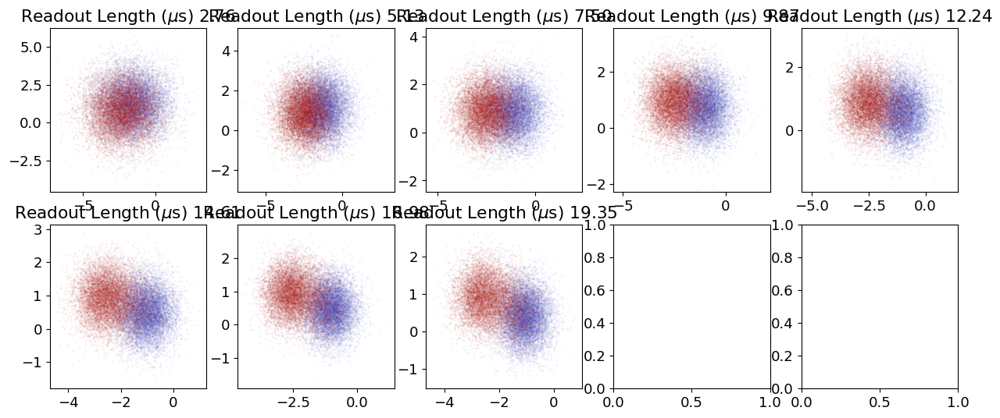

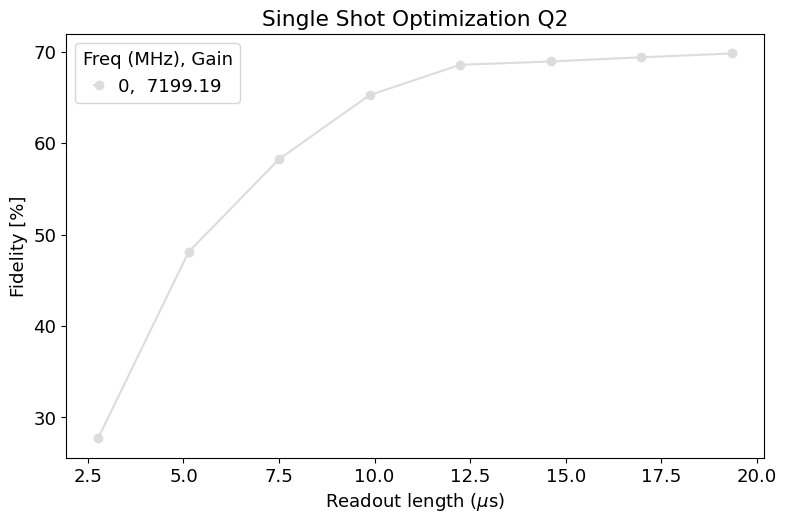

Max fidelity 69.815 %
Optimal params: 
 Freq (MHz) 7199.187 
 Gain (DAC units) 0.070 
 Readout length (us) 19.350
Not all elements in fid_expts are odd.
Set fidelity: 68.578 %
Set params: 
 Freq (MHz) 7199.187 
 Gain (DAC units) 0.070 
 Readout length (us) 12.242
*Set cfg device.readout 2 gain to 0.07 from 0.07*
*Set cfg device.readout 2 readout_length to 12.2419 from 9.2143*
*Set cfg device.readout 2 frequency to 7199.1867 from 7199.1867*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

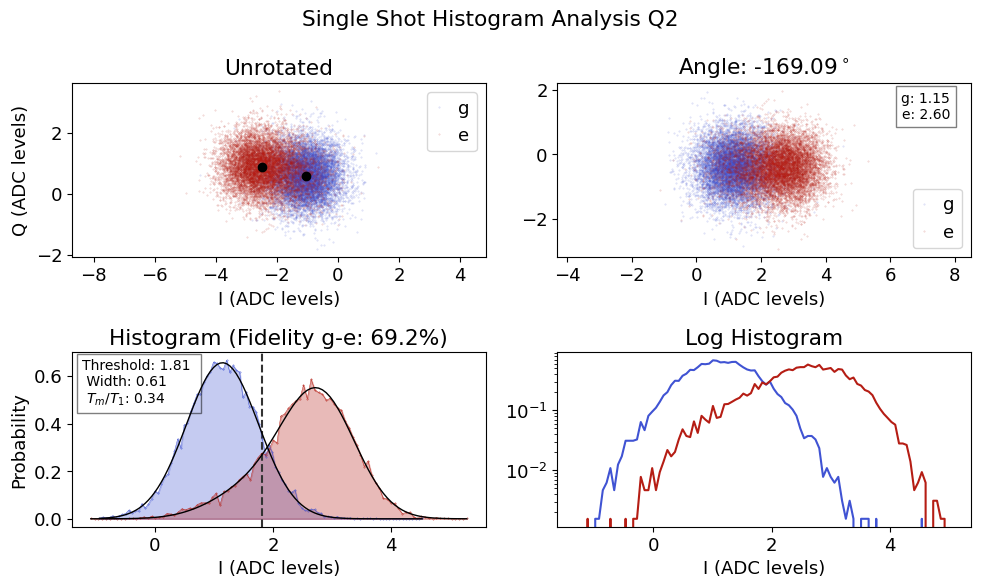

*Set cfg device.readout 2 phase to -169.0944 from -170.4126*
*Set cfg device.readout 2 threshold to 1.8112 from 1.8914*
*Set cfg device.readout 2 fidelity to 0.6925 from 0.6253*
*Set cfg device.readout 2 sigma to 0.6089 from 0.7111*
*Set cfg device.readout 2 tm to 0.3423 from 0.1685*
*Set cfg device.qubit 2 tuned_up to True from True*


In [112]:
update=True
low_gain=True

qubit_list=np.arange(3)
qubit_list=[2]

#params = {'expts_f':1, 'expts_gain':5, 'expts_len':5,'shots':10000}
params = {'expts_f':1, 'expts_gain':1, 'expts_len':8}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params, style='')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

    shot=meas.HistogramExperiment(cfg_dict, qi=qi)
    shot.update()

### Run optimization until it converges

In [ ]:
qubit_list=np.arange(3)
qubit_list=[0]
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[0]
trig_list = np.linspace(0.2,0.6,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig}, progress=False, display=False)
        fids.append(float(shot.data['fids'][0]))
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

# Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

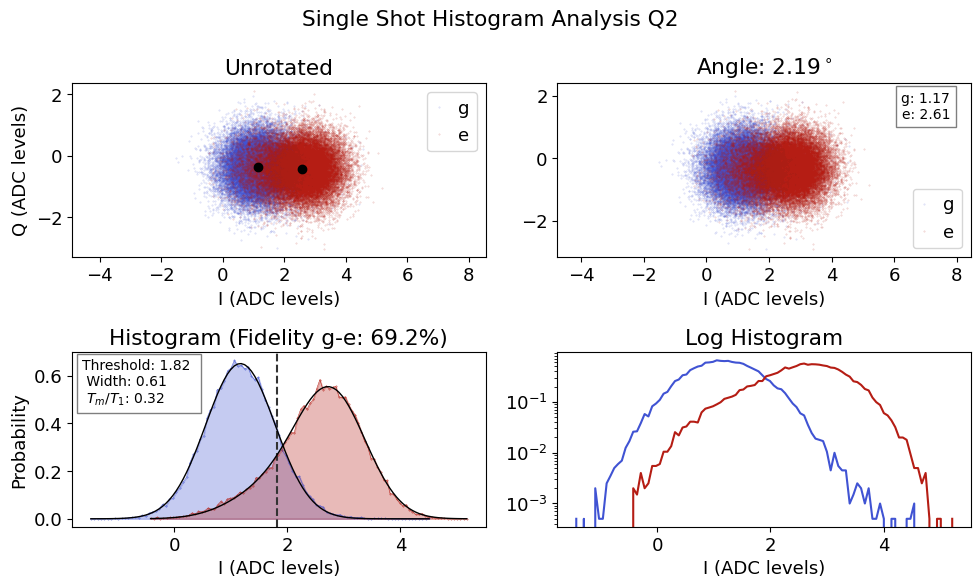

Reset is 0.109371 of e and 1.7188 of g


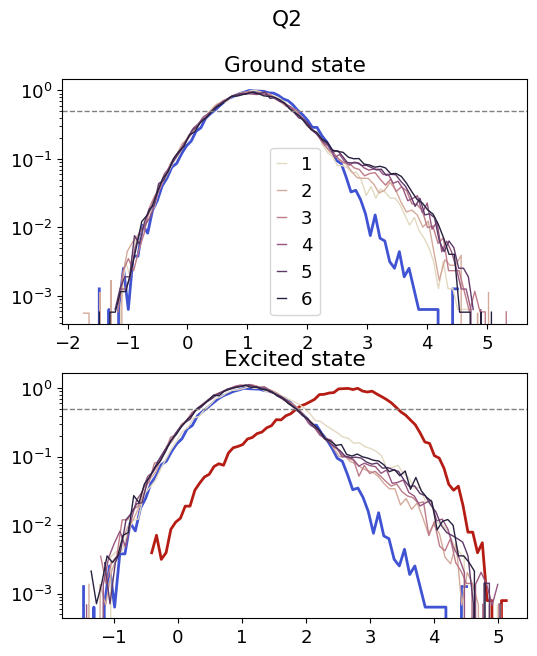

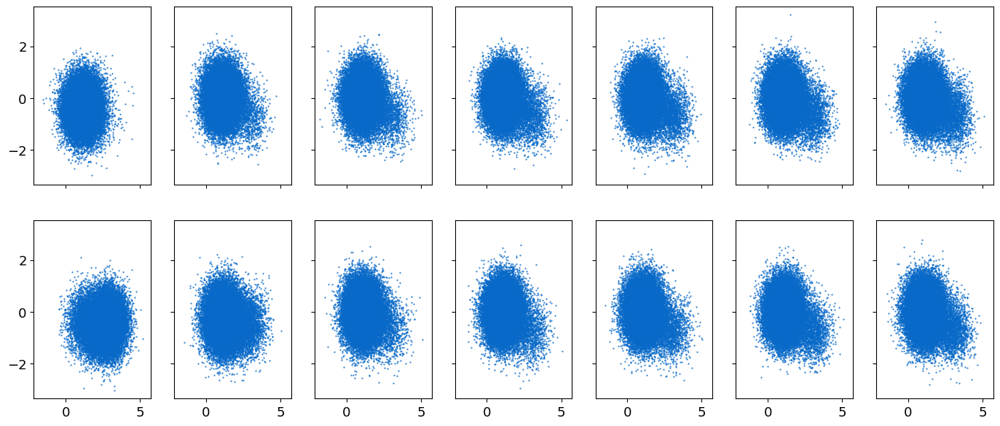

In [113]:
qubit_list = np.arange(3)
qubit_list=[2]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

In [ ]:
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'remeas':True, 'shots':40000})
shot.check_reset()

## Plot fidelity vs v threshold for active reset

In [ ]:
qi=1
rng=10
fids = []

auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,11)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'threshold_v':t, 'active_reset':True,'setup_reset':False, 'reset':3}, display=False, progress=False)
    fids.append(float(shot.data['fids'][0]))
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')

from pathlib import Path

fig = plt.figure()
plt.plot(thresh, fids, 'o-')
plt.xlabel('Threshold (mV)')
plt.ylabel('Fidelity')

file_path = Path(shot.fname)
new_filename = file_path.name.rsplit(".", 1)[0] + "_fidelity_reset.png"
fig.savefig(file_path.parent / "images" / new_filename)

Completed 0/11
Completed 4/11


In [ ]:
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':3})


  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.845	Fit par error:0.043	 Best fit:b'avgi'


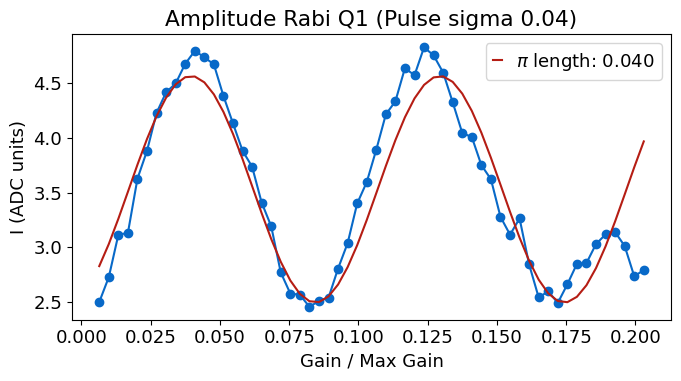

  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.853	Fit par error:0.043	 Best fit:b'avgi'


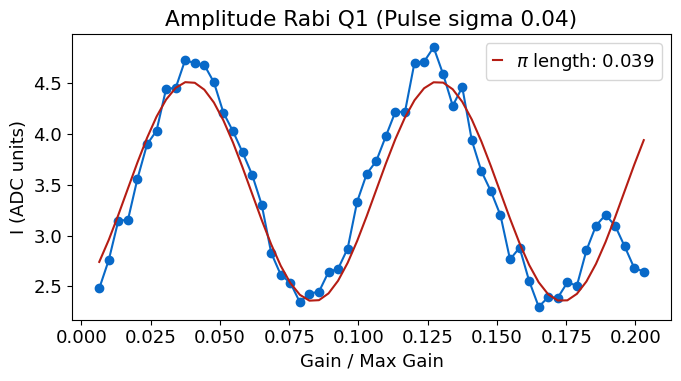

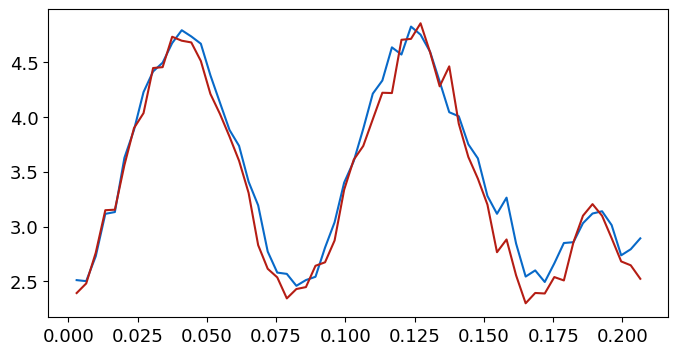

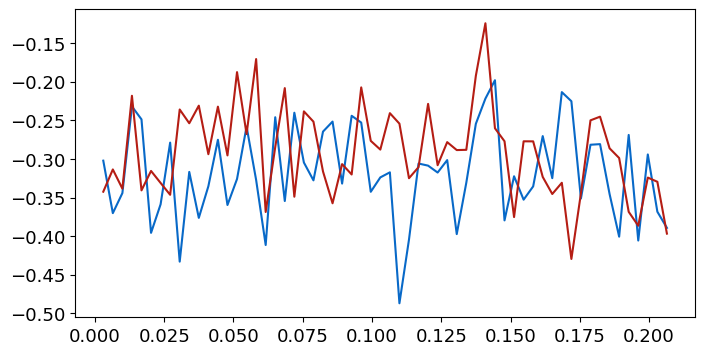

In [23]:
qi=1
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':True})
amp_rabi2 = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgi'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgi'])

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgq'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgq'])


In [ ]:
t1 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':True})
t12 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t1.data['xpts'], t1.data['avgi'])
plt.plot(t12.data['xpts'], t12.data['avgi'])

plt.figure()
plt.plot(t1.data['xpts'], t1.data['avgq'])
plt.plot(t12.data['xpts'], t12.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})
t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'])
plt.plot(t22.data['xpts'], t22.data['avgi'])

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgq'])
plt.plot(t22.data['xpts'], t22.data['avgq'])

# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])

# change the hist to take the first measurement 
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True, 'experiment_type':'echo'})
t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False, 'experiment_type':'echo'})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'])
plt.plot(t22.data['xpts'], t22.data['avgi'])

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgq'])
plt.plot(t22.data['xpts'], t22.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='active reset')
plt.plot(t22.data['xpts'], t22.data['avgi'], label='Normal')
plt.legend()
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])

# change the hist to take the first measurement 
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(amp_rabi.data['bin_centers'], amp_rabi.data['hist'])
plt.plot(amp_rabi2.data['bin_centers'], amp_rabi2.data['hist'])

### Sweep threshold

In [ ]:
d = []
qi=0
rng=25
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,16)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')
    #shot.check_reset()
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

In [ ]:
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

### Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

### Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

### Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[0]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

In [ ]:
# Need a tuned up pi pulse for this

qubit_list = [0]
for qi in qubit_list: 
    chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [ ]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -200
#qubit_list = np.arange(3)
qubit_list = [0,1]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

## Spectroscopy EF

### General search

In [ ]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[0,1,2]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

In [ ]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':500,'gain':0.2})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':750,'gain':0.15, 'span':100})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

In [ ]:
# If first time, initialize the sigma and gain to those of the ge 
first_time = True
update = True

qubit_list = np.arange(3)
qubit_list=[0]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True, 'reps':400})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

    # MAX GAIN IS GOING TO 5 

## Qubit Temperature

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 

for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and Ej

In [ ]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(3):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

## Ramsey EF

In [ ]:
update=True
qubit_list=np.arange(3)
#qubit_list=[12]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'ramsey_freq':0.15, 'checkEF':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Calculate qubit params

In [101]:
from slab_qick_calib.analysis import qubit_params 

config.init_model_config(cfg_dict['cfg_file'], 6)
qubit_params.ham(cfg_path)
qubit_params.delta(cfg_path)
qubit_params.cohere(cfg_path)

# Stark

## Ramsey

### Single experiment

In [ ]:
qi=0
t2_stark = meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':1,'df':40,'acStark':True,'ramsey_freq':0.1, 'expts':100})

### Create stark part of config file for tracking Gain-> Freq

In [ ]:
config.init_stark_section(cfg_dict['cfg_file'], 6)

### Sweep frequency

In [ ]:
qubit_list = np.arange(3)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

You'll want to adjust the step size / expts to capture the full frequency range 

Setting up a new session...


Unexpected parameters found in params: {'end_gain', 'start_gain', 'stark_freq', 'expts_gain'}


  0%|          | 0/16 [00:00<?, ?it/s]

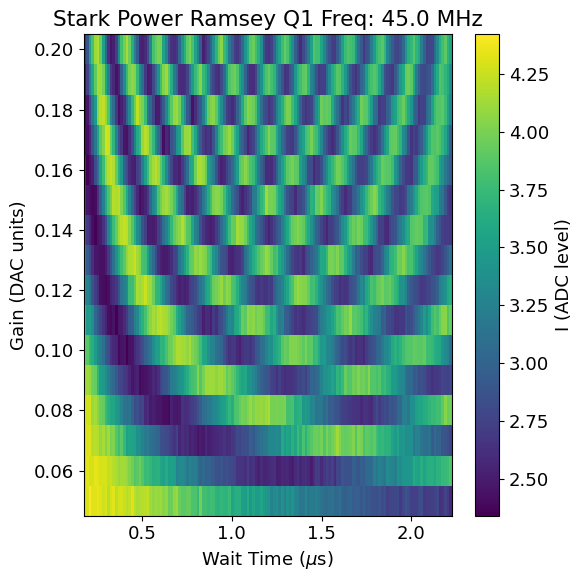

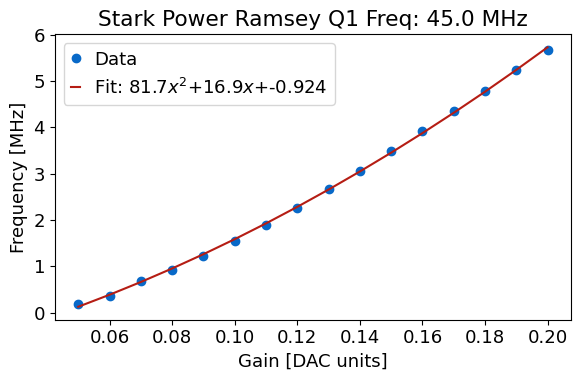

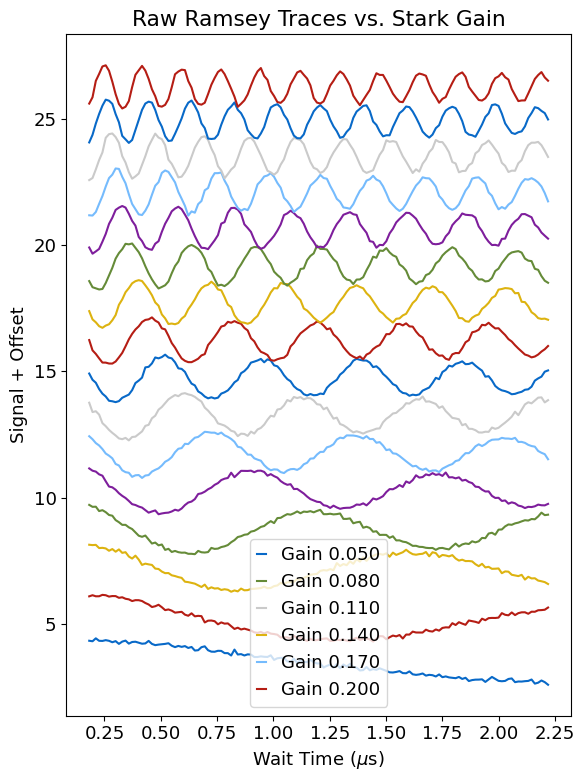

*Set cfg stark 1 q to 81.7465 from 112.1384*
*Set cfg stark 1 l to 16.9082 from 9.3736*
*Set cfg stark 1 o to -0.9238 from -0.4395*
*Set cfg stark 1 f to 45 from 45*


In [78]:
qubit_list = np.arange(3)
qubit_list=[1]
d=[]
freqs= [45]
update=True
for f in freqs:
    for qi in qubit_list:
        params={'step':0.015, 'expts_gain':16, 'df':f, 'start_gain':0.05, 'end_gain':0.2,'expts':140, 'ramsey_freq':0.1}
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
        d.append(t2rstark)
        if update: t2rstark.update(neg=False)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

Setting up a new session...


Unexpected parameters found in params: {'end_gain', 'start_gain', 'stark_freq', 'expts_gain'}


  0%|          | 0/12 [00:00<?, ?it/s]

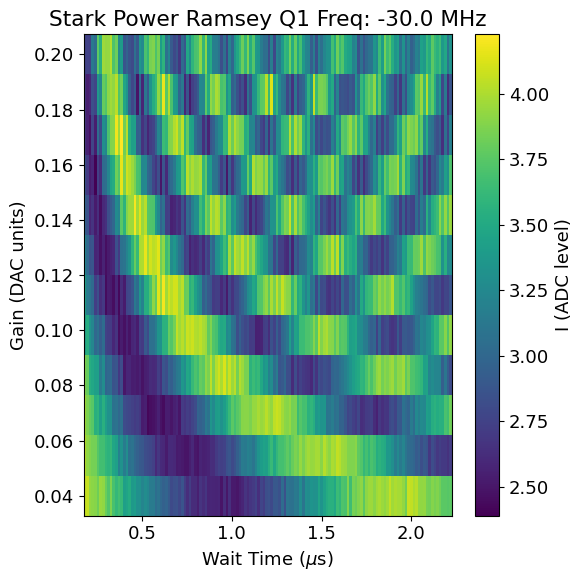

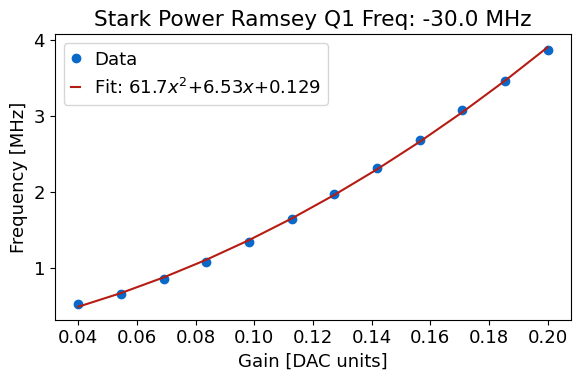

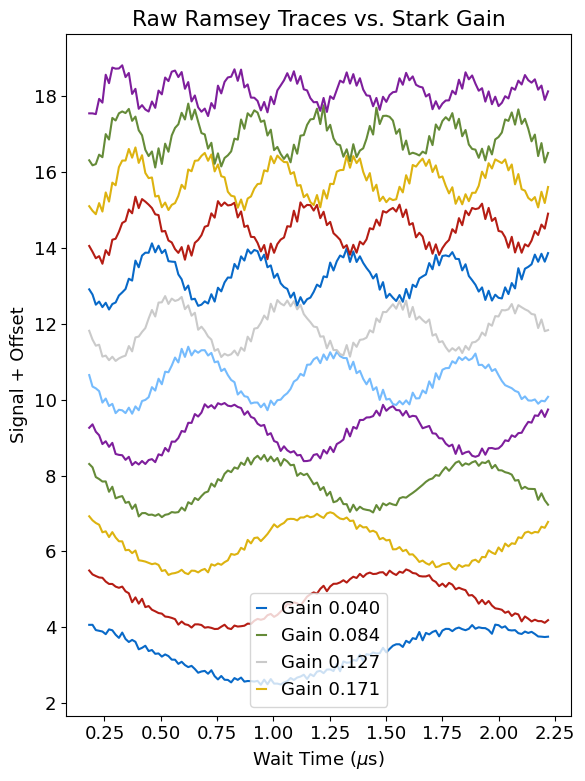

*Set cfg stark 1 qneg to 61.6527 from 66.5*
*Set cfg stark 1 lneg to 6.5319 from 5.5242*
*Set cfg stark 1 oneg to 0.1294 from 0.1761*
*Set cfg stark 1 fneg to -30 from -30*


In [79]:
#qubit_list = np.arange(3)
update=True 
qubit_list=[1]
df = -30
for qi in qubit_list:
    params = {'step':0.015, 'expts_gain':12, 'df':df, 'start_gain':0.04, 'end_gain':0.2, 'expts':140}
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
    if update: t2rstark.update(neg=True)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

Unexpected parameters found in params: {'stark_freq'}
R2:0.084	Fit par error:0.802	 Best fit:b'avgi'


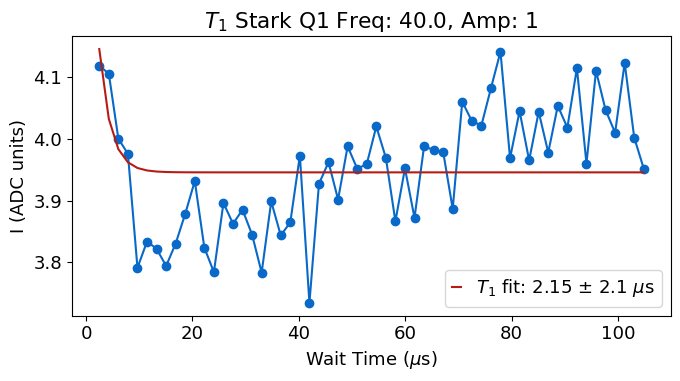

In [39]:
qi=1
gain_list = [1]
for g in gain_list:
    params = {'stark_gain':g,'df':40,'expts':60, 'span':106}
    #params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':1000}
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params=params) 

### Gain sweep

Setting up a new session...


  0%|          | 0/20 [00:00<?, ?it/s]

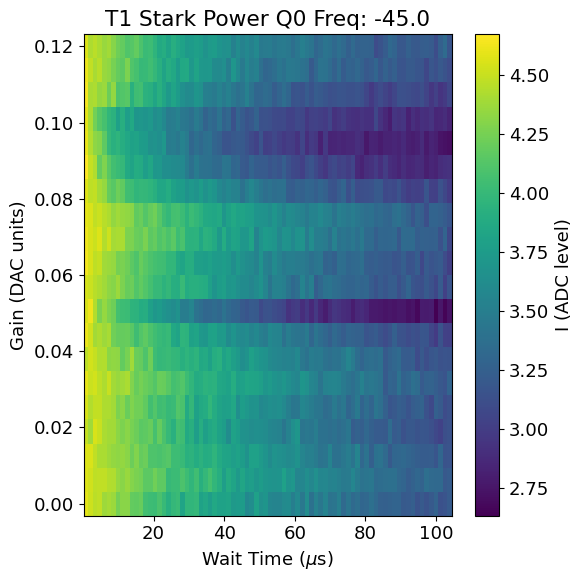

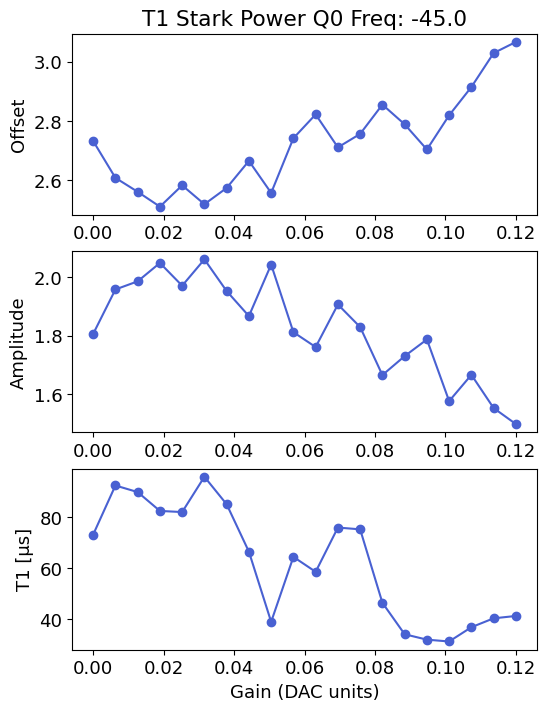

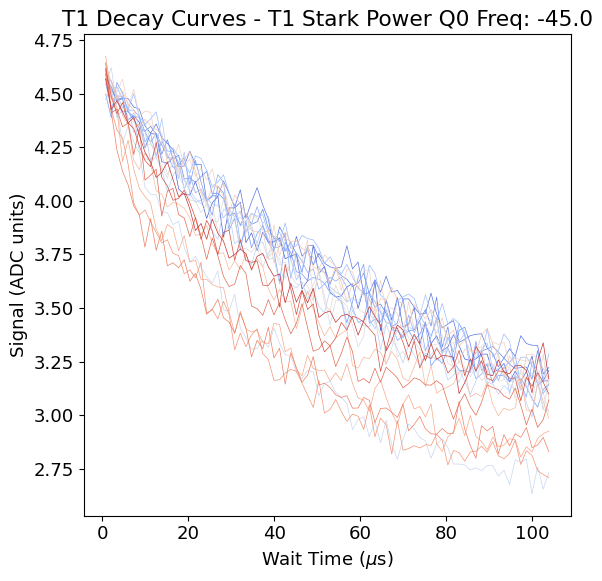

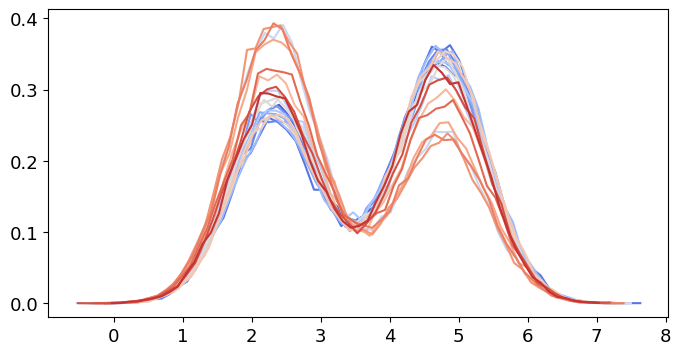

In [11]:
qubit_list = np.arange(3)
qubit_list=[0]
flist=[-45]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})
        params={'df':f,'start_gain':0,'end_gain':0.12,'start':0.2, 'rounds':1,'span':103,'expts_gain':20, 'expts':80}
        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100})

### Sweep frequency linearly, 1d scan

In [ ]:
t1_quad = meas.T1StarkPowerQuadSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':300, "stop_f":3})

# It would be good to add a few excited state and ground state measurements to this. 

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

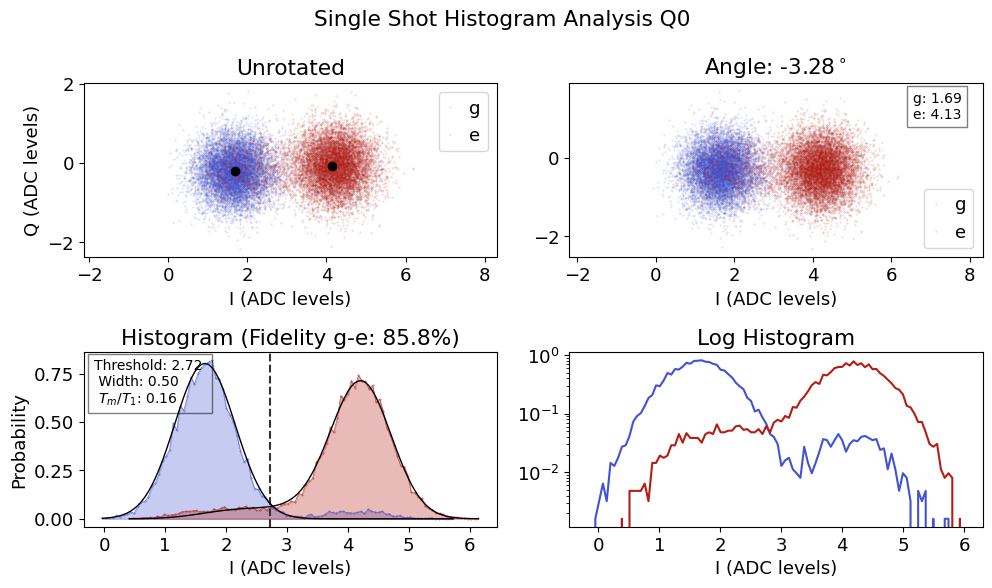

In [41]:
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'active_reset':True,'setup_reset':False, 'reset':3})


In [67]:
auto_cfg = config.load(cfg_path)

In [71]:
auto_cfg.device.qubit.T1[qi]

136.75

In [72]:
t1_norm = -1/np.log((t1_quad_2d.data['scale_data']-shot.data['g_norm'])/shot.data['e_norm'])*tau/auto_cfg.device.qubit.T1[qi]

In [63]:
(t1_quad_2d.data['scale_data']-shot.data['g_norm'])/shot.data['e_norm']

array([[0.54979737, 0.58452518, 0.52784675, 0.55973516, 0.55489543,
        0.54730558, 0.54573374, 0.46190235, 0.52322035, 0.57197626,
        0.57425454, 0.58067236, 0.57255414, 0.60444828, 0.5213796 ,
        0.58366551, 0.56031288, 0.53295128, 0.44691927, 0.5078939 ,
        0.40155856, 0.4322742 , 0.49678625, 0.35309806, 0.44154315,
        0.41766604, 0.47735553, 0.47141194, 0.51669784, 0.57828223,
        0.62129002, 0.61292619, 0.62939519, 0.58847834, 0.57981647,
        0.60304088, 0.59182792, 0.51208597, 0.50008614, 0.55995267,
        0.4955488 , 0.53348137, 0.50170841, 0.50229608, 0.47242707,
        0.42564957, 0.42124903, 0.56970192, 0.52722021, 0.43820949,
        0.47709635, 0.4607535 , 0.5786121 , 0.5047462 , 0.5871212 ,
        0.54376449, 0.58032429, 0.5722332 , 0.57108659, 0.58616937,
        0.60707835, 0.57996397, 0.60825834, 0.57589788, 0.58040294,
        0.62660736, 0.58331772, 0.52876224, 0.59977545, 0.64866358,
        0.56379044, 0.53552818, 0.51037681, 0.61

In [59]:
len(t1_quad_2d.data['scale_data'][0])


99

In [56]:
len(t1_quad_2d.data['scale_data'][0])


10

In [66]:
shot.data['e_norm']
shot.data['g_norm']
tau=99

### Sweep frequency linearly, 2d scan sweep over time

Setting up a new session...


  0%|          | 0/100 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1326: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im1 = axs[0,0].pcolormesh(xvals, yvals, amps_so_far, cmap="viridis", shading="auto")
C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1330: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = axs[0, 1].pcolormesh(xvals, yvals, phases_so_far, cmap="viridis", shading="auto")
C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1334: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but 

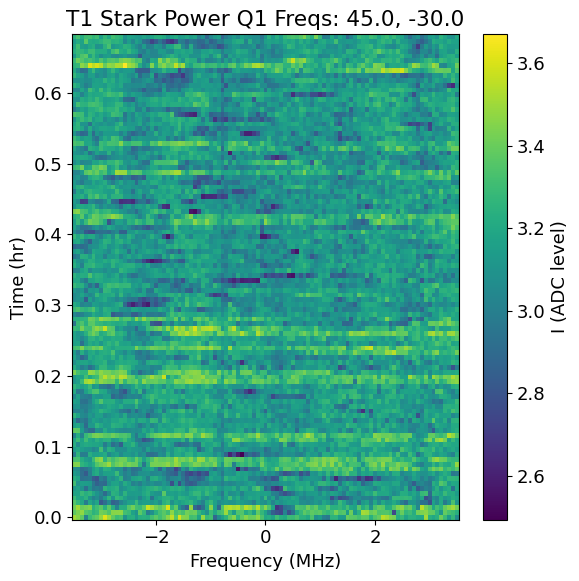

In [74]:
tau=103

t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=1, params={'wait_time':tau, "stop_f":3.5, 'expts':100, "sweep_pts":100}, live_plot=True)

In [ ]:
tau = 103
qi = 1

params={'wait_time':tau, "stop_f":3.5, 'expts':100, "sweep_pts":100, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm']}
t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi,params=params , live_plot=True)

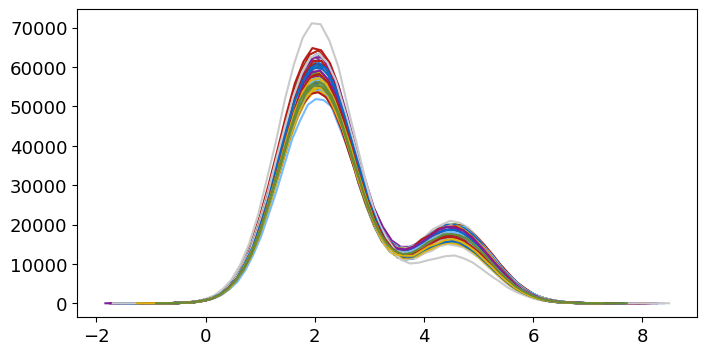

In [42]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])

Text(0, 0.5, 'Wait Time Index')

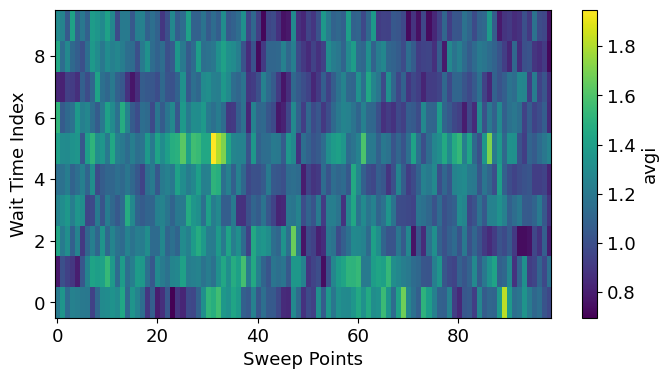

In [73]:
plt.figure()
plt.imshow(t1_norm, aspect='auto', origin='lower')
plt.colorbar(label='avgi')
plt.xlabel('Sweep Points')
plt.ylabel('Wait Time Index')

In [34]:
len(t1_quad_2d.data['xpts'])

10

In [36]:
t1_quad_2d.data['xpts']

array([[-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ],
       [-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ],
       [-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ],
       ...,
       [-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ],
       [-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ],
       [-5.        , -4.94949495, -4.8989899 , ...,  4.8989899 ,
         4.94949495,  5.        ]])

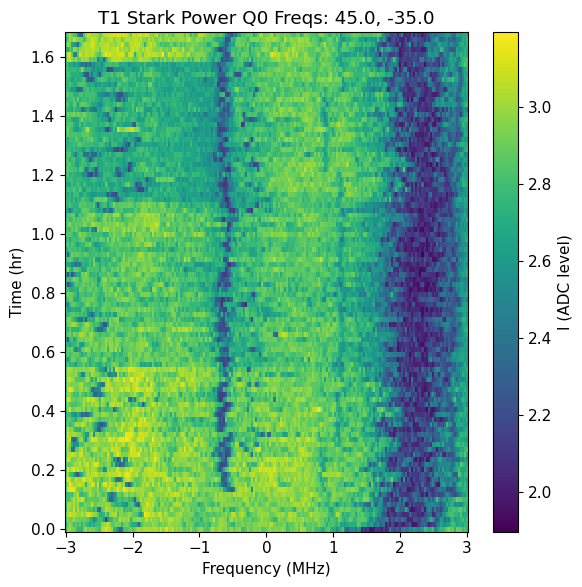

In [39]:
t1_quad_2d.display()